In [139]:
#Marioni lab data utilized, sample number 19- 6996 cells in E7.5 data 
import numpy as np
import time
import random
import os

import plotly.express as px
from sklearn.decomposition import PCA
import itertools
from sklearn.cluster import KMeans # Our clustering algorithm
from sklearn.decomposition import PCA # Needed for dimension reduction
from sklearn.datasets import load_wine # Dataset that I will be using
import matplotlib.pyplot as plt # Plotting 

from sklearn.preprocessing import normalize 
from sklearn.manifold import TSNE
from sklearn.decomposition import PCA

import matplotlib.pyplot as plt
from matplotlib import gridspec
#active SVC 
from activeSVC import min_complexity, min_acquisition
import pandas as pd
import pickle
import os, psutil
import resource
import urllib.request
import shutil


#function to create .pickle files for ActiveSVC in results folder
def text_create(path, name, msg):
    full_path = path + "/" + name + '.pickle'
    f=open(full_path,'wb') 
    pickle.dump(msg,f)
    f.close()

#timer error during activeSVC
class TimerError(Exception):
     """A custom exception used to report errors in use of Timer class"""

#establishes timer for ActiveSVC
class Timer:
    def __init__(self):
        self._start_time = None

    def start(self):
        if self._start_time is not None:
            raise TimerError(f"Timer is running. Use .stop() to stop it")

        self._start_time = time.perf_counter()

    def stop(self):
        if self._start_time is None:
            raise TimerError(f"Timer is not running. Use .start() to start it")

        elapsed_time = time.perf_counter() - self._start_time
        self._start_time = None
        print(f"Total run time: {elapsed_time:0.4f} seconds")
        return elapsed_time

In [140]:
#load in all marioni lab data
data_df_og = pd.read_csv('./data.csv')
print(data_df_og)

               Unnamed: 0  cell_43478  cell_43479  cell_43480  cell_43481  \
0      ENSMUSG00000051951           0           0           0           0   
1      ENSMUSG00000089699           0           0           0           0   
2      ENSMUSG00000102343           0           0           0           0   
3      ENSMUSG00000025900           0           0           0           0   
4      ENSMUSG00000025902           0           0           6           0   
...                   ...         ...         ...         ...         ...   
13994  ENSMUSG00000073804           0           0           0           0   
13995  ENSMUSG00000109891           0           0           0           0   
13996  ENSMUSG00000048377           0           0           0           0   
13997  ENSMUSG00000109598           0           0           0           0   
13998  ENSMUSG00000050866           0           0           0           0   

       cell_43482  cell_43483  cell_43484  cell_43485  cell_43486  ...  \
0

In [141]:
#fix data formatting for SVC probe search
#remove any unwanted columns from data set
data_df = data_df_og.drop(['Unnamed: 0'], axis = 1)
data_df_column_norm = (data_df-data_df.mean())/data_df.std()
#mean normalize all data from marioni lab
data_df_row_norm=(data_df_column_norm.T-data_df_column_norm.T.mean())/data_df_column_norm.T.std()

#make sure that any NaN's are fill with 0's 
data_df = data_df_row_norm.T.fillna(0)
#for the cell analyzer to sort properly, we need to get rid of any header 
new_header = data_df.iloc[0] #grab the first row for the header
data_df = data_df[1:] #take the data less the header row
data_df.columns = new_header #set the header row as the df header
#final data set to be used 
print(data_df)


0      -0.430642  -1.011839  -0.488811   0.585013  -0.476992  -1.046872  \
1      -0.592015  -1.429060  -0.675790   0.870740  -0.658769  -1.479515   
2      -0.592015  -1.429060  -0.675790   0.870740  -0.658769  -1.479515   
3      -0.426763  -1.015041  -0.485641   0.601265  -0.473678  -1.050501   
4      -0.341877  -0.351165   2.559129  -0.325645   2.358114   4.407716   
5      -0.592015  -1.429060  -0.675790   0.870740  -0.658769  -1.479515   
...          ...        ...        ...        ...        ...        ...   
13994  -0.592015  -1.429060  -0.675790   0.870740  -0.658769  -1.479515   
13995  -0.592015  -1.429060  -0.675790   0.870740  -0.658769  -1.479515   
13996  -0.317121  -0.686742  -0.354115   0.328799  -0.346598  -0.709022   
13997  -0.376828  -0.851582  -0.424343   0.452815  -0.414689  -0.880199   
13998  -0.438103  -1.024251  -0.496767   0.586203  -0.484847  -1.059582   

0      -0.758593  -0.855474  -0.159142  -0.481423  ...  -0.398593   0.474353  \
1      -1.064334  -

In [142]:
#load in all marioni lab data
gene_df_og=pd.read_csv('./genes.csv')
#format gene_df
temp = pd.merge(gene_df_og,data_df_og, left_index = True, right_index = True)

li= temp['SYMBOL'].tolist()

gene_df = pd.DataFrame(li)
new_header = gene_df.iloc[0] #grab the first row for the header
gene_df = gene_df[1:] #take the data less the header row
gene_df.columns = new_header #set the header row as the df header
print(gene_df)

0         Xkr4
1       Gm1992
2      Gm37381
3          Rp1
4        Sox17
5      Gm37323
...        ...
13994      Nps
13995  Gm45339
13996    Foxi2
13997  Gm45340
13998    Clrn3

[13998 rows x 1 columns]


In [143]:
#load in all marioni lab data
cell_type_df_og=pd.read_csv('./cellType.csv', header = None)
#format cell_type_df
cell_type_df = cell_type_df_og.drop([0], axis = 1)
cell_type_df = cell_type_df.T
cell_type_df.drop([0], axis = 1, inplace = True)

print(cell_type_df)

           1           2             3                     4             5     \
1  ExE ectoderm  Mesenchyme  ExE endoderm  Rostral neurectoderm  ExE endoderm   

                6           7             8             9     \
1  Visceral endoderm  Mesenchyme  ExE endoderm  ExE endoderm   

                             10    ... 6987              6988  \
1  Haematoendothelial progenitors  ...  NaN  Primitive Streak   

               6989          6990      6991          6992               6993  \
1  Primitive Streak  ExE endoderm  Epiblast  ExE endoderm  Parietal endoderm   

  6994          6995          6996  
1  NaN  ExE endoderm  ExE ectoderm  

[1 rows x 6996 columns]


In [144]:
names_full = []
for i in cell_type_df.iloc[0]:
    if type(i) == str:
        names_full.append(i)
    else:
        names_full.append("Nan")

In [145]:
#create index of cell types you want to use
names = []
for i in cell_type_df.loc[1]:
    names.append(i)
se = set()
for i in names:
    if type(i) == float:
        se.add('nan')
    else:
        se.add(i)
se = list(se)
#creates dictionary of the cell types in use and their respective numbers
numbers = {}
for i in range(1,len(se)+1):
    numbers[se[i-1]]=i
print(numbers)
#create the label for the active svc 
label_df = []
for i in names:
    if type(i) == float:
        label_df.append(numbers['nan'])
    elif type(i) == str:
        for j in numbers:
            if j == i:
                label_df.append(numbers[j])

label_df = pd.DataFrame(label_df).T
print(label_df)

{'ExE ectoderm': 1, 'Anterior Primitive Streak': 2, 'Haematoendothelial progenitors': 3, 'Mixed mesoderm': 4, 'Intermediate mesoderm': 5, 'Def. endoderm': 6, 'Epiblast': 7, 'Paraxial mesoderm': 8, 'Pharyngeal mesoderm': 9, 'nan': 10, 'ExE endoderm': 11, 'Gut': 12, 'Parietal endoderm': 13, 'Nascent mesoderm': 14, 'Blood progenitors 1': 15, 'Surface ectoderm': 16, 'Somitic mesoderm': 17, 'PGC': 18, 'Mesenchyme': 19, 'Notochord': 20, 'Allantois': 21, 'Endothelium': 22, 'Erythroid1': 23, 'Caudal Mesoderm': 24, 'Caudal epiblast': 25, 'Rostral neurectoderm': 26, 'Blood progenitors 2': 27, 'ExE mesoderm': 28, 'Visceral endoderm': 29, 'Primitive Streak': 30, 'Caudal neurectoderm': 31}
   0     1     2     3     4     5     6     7     8     9     ...  6986  \
0     1    19    11    26    11    29    19    11    11     3  ...    10   

   6987  6988  6989  6990  6991  6992  6993  6994  6995  
0    30    30    11     7    11    13    10    11     1  

[1 rows x 6996 columns]


In [146]:
#create buckets here based on numbers from above:
#buckets created with Reza and David
buckets = {'Ectoderm':[numbers['Caudal epiblast'], numbers['Caudal neurectoderm'], numbers['Surface ectoderm'],
                      numbers['Rostral neurectoderm']], 
           
           'Endoderm':[numbers['Visceral endoderm'], numbers['Def. endoderm'], numbers['Gut']], 
           
           'Mesoderm':[numbers['Intermediate mesoderm'], numbers['Endothelium'], numbers['Blood progenitors 1'],
                       numbers['Somitic mesoderm'], numbers['Erythroid1'], numbers['Allantois'], numbers['Mesenchyme'],
                       numbers['Caudal Mesoderm'], numbers['Mixed mesoderm'], numbers['Haematoendothelial progenitors'],
                       numbers['Notochord'], numbers['Anterior Primitive Streak'], numbers['Pharyngeal mesoderm'],
                       numbers['Paraxial mesoderm'], numbers['Nascent mesoderm'],
                       numbers['Blood progenitors 2']
                      ],
           
           'Exe endoderm':[numbers['ExE endoderm']],
           
           'Exe mesoderm':[numbers['ExE mesoderm']],
           
           'Exe ectoderm':[numbers['ExE ectoderm']],
           
           'nan': [numbers['nan']],
           
           'Epiblast, PS, others':[numbers['Primitive Streak'], numbers['Epiblast'], numbers['PGC']
                                  ,numbers['Parietal endoderm']]
          }
print(buckets)

{'Ectoderm': [25, 31, 16, 26], 'Endoderm': [29, 6, 12], 'Mesoderm': [5, 22, 15, 17, 23, 21, 19, 24, 4, 3, 20, 2, 9, 8, 14, 27], 'Exe endoderm': [11], 'Exe mesoderm': [28], 'Exe ectoderm': [1], 'nan': [10], 'Epiblast, PS, others': [30, 7, 18, 13]}


In [147]:
label_df_buckets = []

for label in label_df.iloc[0]:
    for j in buckets:
        if label in buckets[j]:
            label_df_buckets.append(j)
print(label_df_buckets)

['Exe ectoderm', 'Mesoderm', 'Exe endoderm', 'Ectoderm', 'Exe endoderm', 'Endoderm', 'Mesoderm', 'Exe endoderm', 'Exe endoderm', 'Mesoderm', 'Endoderm', 'Mesoderm', 'Ectoderm', 'Mesoderm', 'Exe endoderm', 'Mesoderm', 'Exe endoderm', 'Epiblast, PS, others', 'Mesoderm', 'Mesoderm', 'Mesoderm', 'Exe endoderm', 'nan', 'Mesoderm', 'Exe endoderm', 'Ectoderm', 'Ectoderm', 'Epiblast, PS, others', 'Endoderm', 'Mesoderm', 'Mesoderm', 'Mesoderm', 'Exe endoderm', 'Exe ectoderm', 'Ectoderm', 'nan', 'Exe endoderm', 'Mesoderm', 'Exe ectoderm', 'Ectoderm', 'Exe endoderm', 'Mesoderm', 'Mesoderm', 'Exe ectoderm', 'Endoderm', 'Mesoderm', 'Ectoderm', 'Mesoderm', 'Mesoderm', 'Ectoderm', 'Exe endoderm', 'Exe ectoderm', 'Ectoderm', 'Mesoderm', 'Epiblast, PS, others', 'Ectoderm', 'Exe endoderm', 'Endoderm', 'Epiblast, PS, others', 'nan', 'Mesoderm', 'Mesoderm', 'Exe ectoderm', 'Exe endoderm', 'nan', 'Mesoderm', 'Ectoderm', 'Mesoderm', 'Exe ectoderm', 'Ectoderm', 'Mesoderm', 'Exe ectoderm', 'Exe ectoderm', 'Ec

In [149]:
from umap import UMAP
X = data_df.T

X = X.fillna(0)
umap_2d = UMAP(n_components=2, init='random', random_state=0)
components = umap_2d.fit_transform(X)
fig = px.scatter(components, x=0, y=1, color = label_df_buckets, title = "UMAP of cells with all RNAseq Data" )
fig.update_xaxes(title = "UMAP 1")
fig.update_yaxes(title = "UMAP 0")
fig.show()

In [11]:
label_df_final = []
nan_to_remove = []
for i in label_df_buckets:
    if i == 'Ectoderm':
        label_df_final.append(0)
    elif i == 'Mesoderm':
        label_df_final.append(1)
    elif i == 'Endoderm':
        label_df_final.append(2)
    elif i == 'Exe endoderm':
        label_df_final.append(3)
    elif i == 'Exe mesoderm':
        label_df_final.append(4)
    elif i == 'Exe ectoderm':
        label_df_final.append(5)
    elif i == 'nan':
        label_df_final.append(6)
    elif i == 'Epiblast, PS, others':
        label_df_final.append(7)
label_df_final = pd.DataFrame(label_df_final).T
print(label_df_final)

   0     1     2     3     4     5     6     7     8     9     ...  6986  \
0     5     1     3     0     3     2     1     3     3     1  ...     6   

   6987  6988  6989  6990  6991  6992  6993  6994  6995  
0     7     7     3     7     3     7     6     3     5  

[1 rows x 6996 columns]


In [81]:
import urllib.request
import shutil

data_df = data_df
label_df=label_df_final
gene_df=gene_df
classes=[0,1,2,3,4,5,6,7]
keys=['Ectoderm',
    'Mesoderm',
    'Endoderm',
    'Exe endoderm',
    'Exe mesoderm',
    'Exe ectoderm',
    'nan',
    'Epiblast, PS, others']

raw_data=data_df.values
target=label_df.values.reshape((raw_data.shape[1],)).astype(np.uint8)
gene=gene_df.values.reshape((raw_data.shape[0],))
data=normalize(np.transpose(raw_data),axis=1, norm='l2')



idx = np.arange(np.shape(data)[0])
random.shuffle(idx)
X_train = data[idx[:int(np.shape(data)[0]*4/5)],:]
y_train = target[idx[:int(np.shape(data)[0]*4/5)]]
X_test = data[idx[int(np.shape(data)[0]*4/5):],:]
y_test = target[idx[int(np.shape(data)[0]*4/5):]]

        

print(type(data))
print(np.shape(data),np.shape(target),len(np.unique(target)))
print(np.shape(X_train))
print(np.shape(X_test))
print(np.unique(target))
for i in np.unique(target):
    print('class '+keys[i]+': '+str(np.count_nonzero((target==i)*1)))

<class 'numpy.ndarray'>
(6996, 13998) (6996,) 8
(5596, 13998)
(1400, 13998)
[0 1 2 3 4 5 6 7]
class Ectoderm: 978
class Mesoderm: 1882
class Endoderm: 307
class Exe endoderm: 919
class Exe mesoderm: 77
class Exe ectoderm: 936
class nan: 1076
class Epiblast, PS, others: 821


In [82]:
'''
Parameters
'''
num_features = 60
num_samples=50
init_samples=500
balance=True

folder='results/min_complexity'
path=folder+'/test_'+str(num_features)+'_'+str(num_samples)

try:
    os.mkdir('results')
except OSError:
    print ("Creation of the directory %s failed" % 'results')
else:
    print ("Successfully created the directory %s " % 'results')
try:
    os.mkdir(folder)
except OSError:
    print ("Creation of the directory %s failed" % folder)
else:
    print ("Successfully created the directory %s " % folder)
try:
    os.mkdir(path)
except OSError:
    print ("Creation of the directory %s failed" % path)
else:
    print ("Successfully created the directory %s " % path)

Creation of the directory results failed
Creation of the directory results/min_complexity failed
Successfully created the directory results/min_complexity/test_60_50 


Elapsed time: 18.6799 seconds
feature 0 : gene [10048]  500 samples
training error=11.220157255182274 test error=10.84142857142857
training accuracy=0.2657255182273052 test accuracy=0.25
Elapsed time: 6.4212 seconds
feature 1 : gene 4765  539 samples
training error=11.210150107219443 test error=10.852857142857143
training accuracy=0.2705503931379557 test accuracy=0.2507142857142857
Elapsed time: 6.1584 seconds
feature 2 : gene 2484  580 samples
training error=11.241601143674053 test error=10.887142857142857
training accuracy=0.2707290922087205 test accuracy=0.25142857142857145
Elapsed time: 6.3091 seconds
feature 3 : gene 11201  617 samples
training error=11.108827734095783 test error=10.904285714285715
training accuracy=0.27769835596854897 test accuracy=0.25142857142857145
Elapsed time: 6.4137 seconds
feature 4 : gene 6331  656 samples
training error=11.068977841315226 test error=10.918571428571429
training accuracy=0.278770550393138 test accuracy=0.2507142857142857
Elapsed time: 6.41

Elapsed time: 11.1297 seconds
feature 43 : gene 5034  1729 samples
training error=8.571122230164404 test error=8.525
training accuracy=0.4131522516082916 test accuracy=0.3914285714285714
Elapsed time: 11.2161 seconds
feature 44 : gene 1441  1747 samples
training error=8.563795568263044 test error=8.552857142857142
training accuracy=0.41333095067905645 test accuracy=0.39071428571428574
Elapsed time: 12.2394 seconds
feature 45 : gene 3985  1761 samples
training error=8.572551822730523 test error=8.543571428571429
training accuracy=0.4135096497498213 test accuracy=0.3914285714285714
Elapsed time: 11.7859 seconds
feature 46 : gene 822  1780 samples
training error=8.584524660471766 test error=8.54
training accuracy=0.41368834882058614 test accuracy=0.39285714285714285
Elapsed time: 11.2336 seconds
feature 47 : gene 3809  1802 samples
training error=8.58398856325947 test error=8.565714285714286
training accuracy=0.4135096497498213 test accuracy=0.3921428571428571
Elapsed time: 12.7996 second

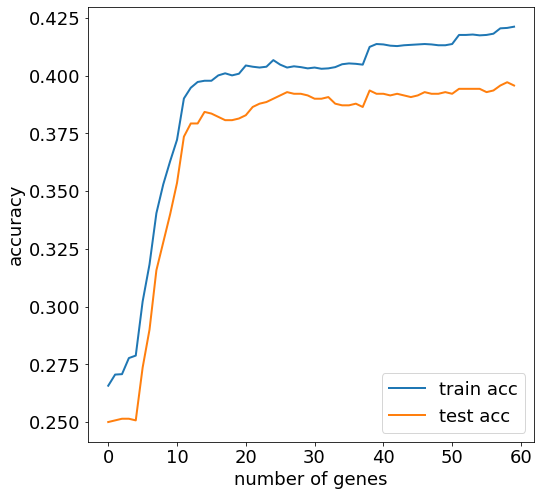

In [83]:
t=Timer()
t.start()
feature_selected, num_samples_list, train_errors,test_errors,train_scores,test_scores, step_times= min_complexity(
    X_train,y_train,X_test,y_test,num_features=num_features,num_samples=num_samples,init_samples=init_samples, balance=balance)
elapsed_time=t.stop()

memorys=[]
memorys.append(psutil.Process(os.getpid()).memory_info().rss / 1024 ** 2)
memorys.append(resource.getrusage(resource.RUSAGE_SELF).ru_maxrss/ 1024 ** 2)

text_create(path,'feature_selected',feature_selected)
text_create(path,'error',train_errors+test_errors)
text_create(path,'accuracy',train_scores+test_scores)
text_create(path,'num_samples_list',num_samples_list)
text_create(path,'genes_name',gene[feature_selected])
text_create(path,'elapsed_time',elapsed_time)
text_create(path,'memory',memorys)

plt.figure(figsize=(8,8))
plt.plot(train_scores,linewidth=2)
plt.plot(test_scores,linewidth=2)
plt.legend(['train acc','test acc'],prop = {'size':18})
plt.xlabel('number of genes',fontdict={'weight':'normal','size': 18})
plt.ylabel('accuracy',fontdict={'weight':'normal','size': 18})
plt.tick_params(labelsize=18)
plt.savefig(path+'/acc.pdf', bbox_inches="tight")

Elapsed time: 17.8720 seconds
feature 0 : gene [1320]  500 samples
training error=10.240171551107935 test error=10.047142857142857
training accuracy=0.3800929235167977 test accuracy=0.37357142857142855
Elapsed time: 17.6713 seconds
feature 1 : gene 674  500 samples
training error=8.840600428877769 test error=8.621428571428572
training accuracy=0.4524660471765547 test accuracy=0.4492857142857143
Elapsed time: 18.6918 seconds
feature 2 : gene 501  500 samples
training error=9.193352394567547 test error=8.844285714285714
training accuracy=0.4649749821300929 test accuracy=0.47714285714285715
Elapsed time: 19.6633 seconds
feature 3 : gene 4931  500 samples
training error=8.33541815582559 test error=7.9678571428571425
training accuracy=0.5012508934953538 test accuracy=0.5128571428571429
Elapsed time: 20.4939 seconds
feature 4 : gene 4359  500 samples
training error=7.652430307362402 test error=7.298571428571429
training accuracy=0.5344889206576126 test accuracy=0.5478571428571428
Elapsed tim

Elapsed time: 95.0526 seconds
feature 42 : gene 38  500 samples
training error=5.394924946390279 test error=4.929285714285714
training accuracy=0.7026447462473195 test accuracy=0.71
Elapsed time: 96.5723 seconds
feature 43 : gene 1463  500 samples
training error=5.3927805575411005 test error=4.95
training accuracy=0.7056826304503216 test accuracy=0.7164285714285714
Elapsed time: 92.2900 seconds
feature 44 : gene 5688  500 samples
training error=4.862044317369549 test error=4.425
training accuracy=0.720157255182273 test accuracy=0.7314285714285714
Elapsed time: 82.9704 seconds
feature 45 : gene 12295  500 samples
training error=4.831665475339528 test error=4.511428571428572
training accuracy=0.7267691208005719 test accuracy=0.7321428571428571
Elapsed time: 83.8197 seconds
feature 46 : gene 9759  500 samples
training error=4.857040743388135 test error=4.492142857142857
training accuracy=0.7260543245175125 test accuracy=0.7342857142857143
Elapsed time: 85.0497 seconds
feature 47 : gene 46

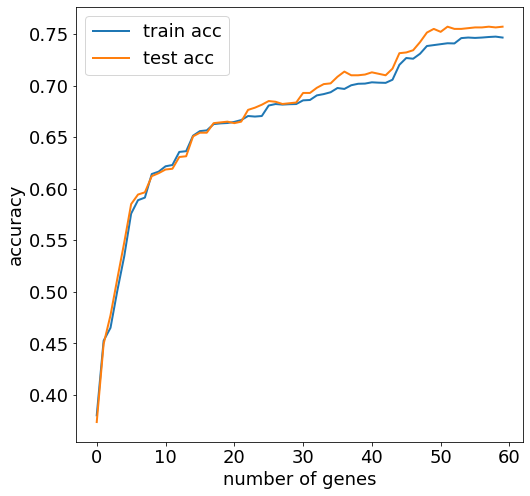

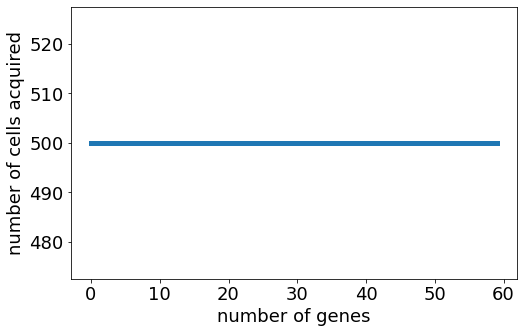

In [84]:

t=Timer()
t.start()
feature_selected, num_samples_list, samples_global, train_errors,test_errors,train_scores,test_scores,step_times= min_acquisition(
    X_train,y_train,X_test,y_test,num_features=num_features,num_samples=num_samples, init_samples=init_samples)
elapsed_time=t.stop()

memorys=[]
memorys.append(psutil.Process(os.getpid()).memory_info().rss / 1024 ** 2)
memorys.append(resource.getrusage(resource.RUSAGE_SELF).ru_maxrss/ 1024 ** 2)

text_create(path,'feature_selected',feature_selected)
text_create(path,'error',train_errors+test_errors)
text_create(path,'accuracy',train_scores+test_scores)
text_create(path,'num_samples_list',num_samples_list)
text_create(path,'samples_global',samples_global)
text_create(path,'genes_name',gene[feature_selected])
text_create(path,'elapsed_time',elapsed_time)
text_create(path,'memory',memorys)

plt.figure(figsize=(8,8))
plt.plot(train_scores,linewidth=2)
plt.plot(test_scores,linewidth=2)
plt.legend(['train acc','test acc'],prop = {'size':18})
plt.xlabel('number of genes',fontdict={'weight':'normal','size': 18})
plt.ylabel('accuracy',fontdict={'weight':'normal','size': 18})
plt.tick_params(labelsize=18)
plt.savefig(path+'/acc.pdf', bbox_inches="tight")

plt.figure(figsize=(8,5))
plt.plot(num_samples_list,linewidth=5)
plt.xlabel('number of genes',fontdict={'weight':'normal','size': 18})
plt.ylabel('number of cells acquired',fontdict={'weight':'normal','size': 18})
plt.tick_params(labelsize=18)
plt.savefig(path+'/cells.pdf', bbox_inches="tight")

/opt/miniconda3/lib/python3.9/site-packages/sklearn/manifold/_t_sne.py:780: FutureWarning:

The default initialization in TSNE will change from 'random' to 'pca' in 1.2.

/opt/miniconda3/lib/python3.9/site-packages/sklearn/manifold/_t_sne.py:790: FutureWarning:

The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.



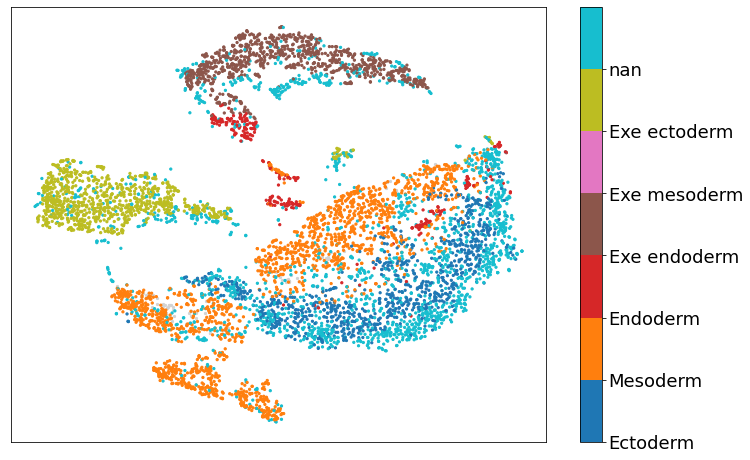

In [85]:
plt.figure(figsize=(12,8))
pca=PCA(n_components=74,
       copy=True,
       whiten=False,
       svd_solver='auto',
       tol=0.0,
       iterated_power='auto',
       random_state=None)

pcaproj=pca.fit_transform(data)

Y=TSNE(n_components=2).fit_transform(pcaproj)

others=list(np.where(target==4)[0])
cells=list(np.where(target!=4)[0])

c_cmap = plt.get_cmap('tab10', len(classes)-1)
plt.scatter(Y[others,0], Y[others,1], c='lightgray', s=5)
plt.scatter(Y[cells,0],Y[cells,1],c=target[cells],s=5,cmap=c_cmap)
cbar=plt.colorbar(ticks=np.arange(len(classes)-1))
plt.xticks([])
plt.yticks([])
cbar.ax.set_yticklabels(keys[:-1],fontdict={'weight':'normal','size': 18})
plt.savefig(path+'/tsne.pdf',bbox_inches="tight")

f=open(path+'/tsne.pickle','wb') 
pickle.dump(Y,f)
f.close()

/opt/miniconda3/lib/python3.9/site-packages/sklearn/manifold/_t_sne.py:780: FutureWarning:

The default initialization in TSNE will change from 'random' to 'pca' in 1.2.

/opt/miniconda3/lib/python3.9/site-packages/sklearn/manifold/_t_sne.py:790: FutureWarning:

The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.



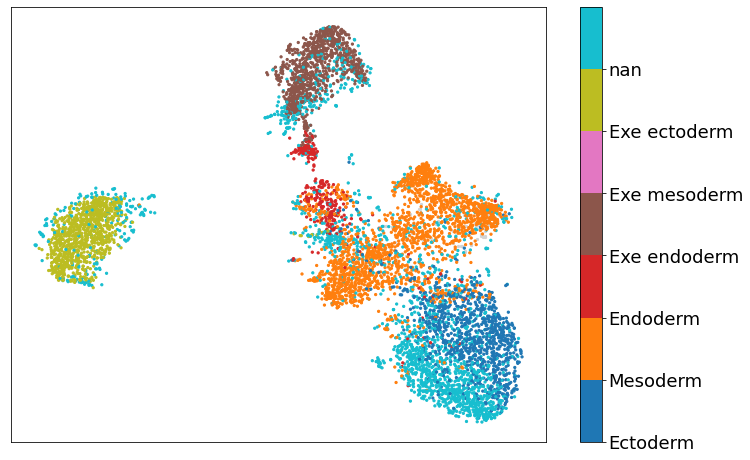

In [86]:
plt.figure(figsize=(12,8))
data_selected=data[:,feature_selected]

pca=PCA(n_components=7,
       copy=True,
       whiten=False,
       svd_solver='auto',
       tol=0.0,
       iterated_power='auto',
       random_state=None)
pcaproj=pca.fit_transform(data_selected)

Y_selected=TSNE(n_components=2,perplexity=200,early_exaggeration=1).fit_transform(pcaproj)

others=list(np.where(target==4)[0])
cells=list(np.where(target!=4)[0])

c_cmap = plt.get_cmap('tab10', len(classes)-1)
plt.scatter(Y_selected[others,0], Y_selected[others,1], c='lightgray', s=5)
plt.scatter(Y_selected[cells,0],Y_selected[cells,1],c=target[cells],s=5,cmap=c_cmap)
cbar=plt.colorbar(ticks=np.arange(len(classes)-1))
plt.xticks([])
plt.yticks([])
cbar.ax.set_yticklabels(keys[:-1],fontdict={'weight':'normal','size': 18})
plt.savefig(path+'/tsne_selected_wPCA.pdf',bbox_inches="tight")

f=open(path+'/tsne_selected_wPCA.pickle','wb') 
pickle.dump(Y_selected,f)
f.close()

/var/folders/_1/v77zt5js6k783_zdyv8b691h0000gn/T/ipykernel_8680/357269846.py:2: RuntimeWarning:

invalid value encountered in log1p



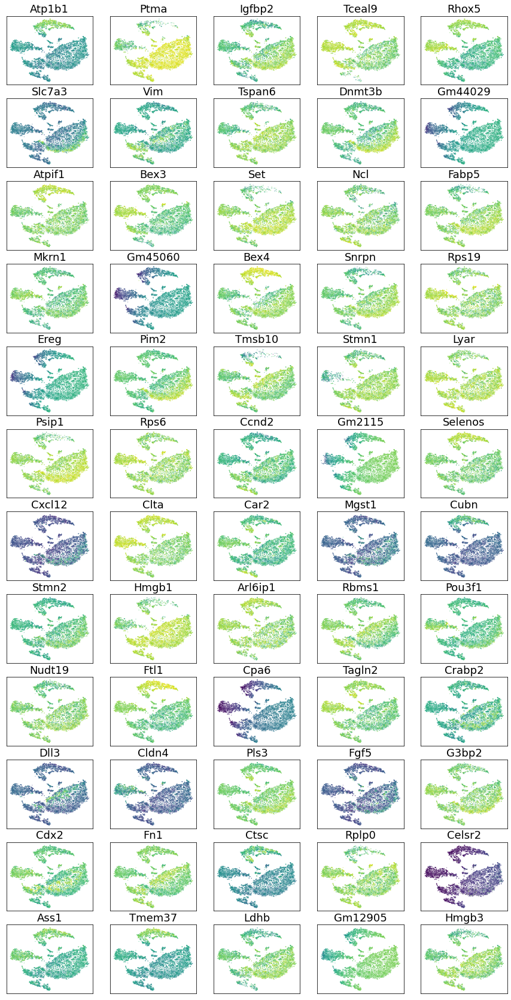

In [87]:
alpha = 100
data_show = np.log1p(data*alpha)

size=len(feature_selected)
plt.figure(figsize=(15,2.5*int(size/5)))
gs = gridspec.GridSpec(int(size/5), 5, width_ratios=[7,7,7,7,7])

genes = []
for i in range(size):
    f=feature_selected[i]
    ax0 = plt.subplot(gs[i])
    ax0.set_title(gene[f],fontdict={'weight':'normal','size': 18})
    genes.append(gene[f])
    plt.scatter(Y[:,0],Y[:,1],c=data_show[:,f],s=0.05)
    ax0.set_xticks([])
    ax0.set_yticks([])
plt.savefig(path+'/gene.png',dpi=300,  bbox_inches="tight") 

In [108]:
old_genes = ['Apoe', 'Ctsz', 'Atp6v0b', 'Cubn', 'Npl', '2610528J11Rik', 'Cited1', 'Tmem37', 'Ftl1', 'Atp1b1', 'Cdx4', 'Spin2c', 'Hoxd9', 'Col9a1', 'Hoxa10', 'Cdx2', 'Hoxd1', 'Msx1', 'Sh3bgrl3', 'Vim', 'Fabp3', 'Elf5', 'Gjb3', 'Cldn3', 'Bex3', 'Rhox5', 'Nup62cl', 'Anxa5', 
             'Sfn', 'Ddah1', 'Rpl6', 'Rps6', 'Rplp0', 'Bag1', 'Sephs2', 'Dnajc19', 'Rps3a1', 'Rps9', 'Rps11', 'Ubc']
print(genes)
whole_genes = genes + old_genes
#genes = genes+old_genes
whole_genes = set(whole_genes)
whole_genes = list(whole_genes)
print(len(whole_genes))
print(whole_genes)

['Atp1b1', 'Ptma', 'Igfbp2', 'Tceal9', 'Rhox5', 'Slc7a3', 'Vim', 'Tspan6', 'Dnmt3b', 'Gm44029', 'Atpif1', 'Bex3', 'Set', 'Ncl', 'Fabp5', 'Mkrn1', 'Gm45060', 'Bex4', 'Snrpn', 'Rps19', 'Ereg', 'Pim2', 'Tmsb10', 'Stmn1', 'Lyar', 'Psip1', 'Rps6', 'Ccnd2', 'Gm2115', 'Selenos', 'Cxcl12', 'Clta', 'Car2', 'Mgst1', 'Cubn', 'Stmn2', 'Hmgb1', 'Arl6ip1', 'Rbms1', 'Pou3f1', 'Nudt19', 'Ftl1', 'Cpa6', 'Tagln2', 'Crabp2', 'Dll3', 'Cldn4', 'Pls3', 'Fgf5', 'G3bp2', 'Cdx2', 'Fn1', 'Ctsc', 'Rplp0', 'Celsr2', 'Ass1', 'Tmem37', 'Ldhb', 'Gm12905', 'Hmgb3']
90
['Stmn2', 'Snrpn', 'G3bp2', 'Dll3', 'Hmgb3', 'Col9a1', 'Fabp3', 'Sfn', 'Rhox5', 'Celsr2', 'Set', 'Ass1', 'Gjb3', 'Mgst1', 'Rps19', 'Rps9', 'Bex3', 'Spin2c', 'Tceal9', 'Gm2115', 'Cldn4', 'Pou3f1', 'Bag1', 'Ctsz', 'Pls3', 'Tmem37', 'Ereg', 'Car2', 'Hoxa10', 'Elf5', 'Cubn', 'Rbms1', 'Ddah1', 'Tspan6', 'Dnajc19', 'Atp1b1', 'Nudt19', 'Psip1', 'Mkrn1', 'Gm12905', 'Dnmt3b', 'Ftl1', 'Rps11', 'Hoxd9', 'Cited1', 'Fabp5', 'Igfbp2', 'Pim2', 'Rps6', 'Ncl', 'Rplp0', 

In [109]:
print(len(genes))
print(len(old_genes))
print(len(genes+old_genes))
print(len(set(genes+old_genes)))

60
40
100
90


In [110]:
#genes = whole_genes

In [111]:
gene_list = gene_df.values.tolist()
whole_genes = pd.DataFrame(whole_genes)
whole_genes.set_index([0], inplace = True)
data_df_pca = data_df_og.drop(['Unnamed: 0'], axis = 1)
data_df_column_norm_pca = (data_df_pca-data_df_pca.mean())/data_df_pca.std()
data_df_row_norm_pca=(data_df_column_norm_pca.T-data_df_column_norm_pca.T.mean())/data_df_column_norm_pca.T.std()
data_df_pca = data_df_row_norm_pca.T.fillna(0)
cell_types = cell_type_df.values.tolist()
data_df_pca.columns = [cell_types[0]]

In [112]:
temp_pca = pd.merge(gene_df_og,data_df_og, left_index = True, right_index = True)

li_pca= temp['SYMBOL'].tolist()
data_df_pca.index = li_pca
print(data_df_pca)

        ExE ectoderm Mesenchyme ExE endoderm Rostral neurectoderm  \
Xkr4       -0.430642  -1.011839    -0.488811             0.585013   
Gm1992     -0.592015  -1.429060    -0.675790             0.870740   
Gm37381    -0.592015  -1.429060    -0.675790             0.870740   
Rp1        -0.426763  -1.015041    -0.485641             0.601265   
Sox17      -0.341877  -0.351165     2.559129            -0.325645   
...              ...        ...          ...                  ...   
Nps        -0.592015  -1.429060    -0.675790             0.870740   
Gm45339    -0.592015  -1.429060    -0.675790             0.870740   
Foxi2      -0.317121  -0.686742    -0.354115             0.328799   
Gm45340    -0.376828  -0.851582    -0.424343             0.452815   
Clrn3      -0.438103  -1.024251    -0.496767             0.586203   

        ExE endoderm Visceral endoderm Mesenchyme ExE endoderm ExE endoderm  \
Xkr4       -0.476992         -1.046872  -0.758593    -0.855474    -0.159142   
Gm1992     -0

In [113]:
combined = whole_genes.join(data_df_pca).fillna(0)
combined.columns = [cell_types[0]]
combined.index.name = 'Genes'
print(combined)

              ExE ectoderm Mesenchyme ExE endoderm Rostral neurectoderm  \
Genes                                                                     
2610528J11Rik    -0.457029  -0.467251     4.332471            -0.439166   
Anxa5             1.042123  -0.516914    -0.505124            -0.480917   
Apoe             -0.286467  -0.377509     3.061197            -0.482234   
Arl6ip1           0.976689   1.559511     3.027806            -0.811631   
Ass1              0.266444  -0.600563     0.542671            -0.570661   
...                    ...        ...          ...                  ...   
Tmem37           -0.471394  -0.479596     2.090338            -0.457061   
Tmsb10            0.153498   0.982225    -1.373512            -0.588238   
Tspan6           -1.010257  -1.022677    -0.364727             0.169728   
Ubc               1.450864  -0.295354    -0.513725             1.369844   
Vim              -0.552917   3.277771    -0.554158            -0.531247   

              ExE endode

In [114]:
names = []
specific_names = []
count = 0
counts = 0
for i in combined:
    counts += 1
    if type(i[0]) == float:
        specific_names.append('nan')
        names.append('nan')
        count +=1
    else:
        specific_names.append(i[0])
        for j in buckets:
            if numbers[i[0]] in buckets[j]:
                count +=1 
                names.append(j)
print(specific_names)
print(names)

['ExE ectoderm', 'Mesenchyme', 'ExE endoderm', 'Rostral neurectoderm', 'ExE endoderm', 'Visceral endoderm', 'Mesenchyme', 'ExE endoderm', 'ExE endoderm', 'Haematoendothelial progenitors', 'Visceral endoderm', 'Haematoendothelial progenitors', 'Rostral neurectoderm', 'Haematoendothelial progenitors', 'ExE endoderm', 'Nascent mesoderm', 'ExE endoderm', 'Primitive Streak', 'Haematoendothelial progenitors', 'Mesenchyme', 'Nascent mesoderm', 'ExE endoderm', 'nan', 'Blood progenitors 1', 'ExE endoderm', 'Surface ectoderm', 'Rostral neurectoderm', 'Primitive Streak', 'Def. endoderm', 'Mesenchyme', 'Mixed mesoderm', 'Mesenchyme', 'ExE endoderm', 'ExE ectoderm', 'Rostral neurectoderm', 'nan', 'ExE endoderm', 'Notochord', 'ExE ectoderm', 'Caudal epiblast', 'ExE endoderm', 'Somitic mesoderm', 'Blood progenitors 2', 'ExE ectoderm', 'Gut', 'Blood progenitors 2', 'Caudal epiblast', 'Mixed mesoderm', 'Anterior Primitive Streak', 'Rostral neurectoderm', 'ExE endoderm', 'ExE ectoderm', 'Rostral neurect

In [115]:
comparison_list = {}
for i in names:
    if i not in comparison_list:
        comparison_list[i] = 0 
    else:
        comparison_list[i] += 1
print(comparison_list)

{'Exe ectoderm': 935, 'Mesoderm': 1881, 'Exe endoderm': 918, 'Ectoderm': 977, 'Endoderm': 306, 'Epiblast, PS, others': 820, 'nan': 1075, 'Exe mesoderm': 76}


In [116]:
transposed = combined.T
gene = []
for i in whole_genes.T:
    gene.append(i)
print(gene)


['Stmn2', 'Snrpn', 'G3bp2', 'Dll3', 'Hmgb3', 'Col9a1', 'Fabp3', 'Sfn', 'Rhox5', 'Celsr2', 'Set', 'Ass1', 'Gjb3', 'Mgst1', 'Rps19', 'Rps9', 'Bex3', 'Spin2c', 'Tceal9', 'Gm2115', 'Cldn4', 'Pou3f1', 'Bag1', 'Ctsz', 'Pls3', 'Tmem37', 'Ereg', 'Car2', 'Hoxa10', 'Elf5', 'Cubn', 'Rbms1', 'Ddah1', 'Tspan6', 'Dnajc19', 'Atp1b1', 'Nudt19', 'Psip1', 'Mkrn1', 'Gm12905', 'Dnmt3b', 'Ftl1', 'Rps11', 'Hoxd9', 'Cited1', 'Fabp5', 'Igfbp2', 'Pim2', 'Rps6', 'Ncl', 'Rplp0', 'Crabp2', '2610528J11Rik', 'Selenos', 'Msx1', 'Cldn3', 'Vim', 'Bex4', 'Apoe', 'Clta', 'Ubc', 'Rps3a1', 'Ccnd2', 'Lyar', 'Gm45060', 'Fn1', 'Slc7a3', 'Sephs2', 'Ldhb', 'Tmsb10', 'Cpa6', 'Stmn1', 'Cdx4', 'Atpif1', 'Arl6ip1', 'Rpl6', 'Ctsc', 'Atp6v0b', 'Hmgb1', 'Anxa5', 'Cxcl12', 'Hoxd1', 'Tagln2', 'Ptma', 'Cdx2', 'Gm44029', 'Sh3bgrl3', 'Fgf5', 'Npl', 'Nup62cl']


In [117]:
print(transposed)

Genes                 2610528J11Rik     Anxa5      Apoe   Arl6ip1      Ass1  \
ExE ectoderm              -0.457029  1.042123 -0.286467  0.976689  0.266444   
Mesenchyme                -0.467251 -0.516914 -0.377509  1.559511 -0.600563   
ExE endoderm               4.332471 -0.505124  3.061197  3.027806  0.542671   
Rostral neurectoderm      -0.439166 -0.480917 -0.482234 -0.811631 -0.570661   
ExE endoderm               4.495906 -0.504858  3.615946  2.699774 -0.590548   
...                             ...       ...       ...       ...       ...   
ExE endoderm               1.757598 -0.494973  2.989817  1.434769  0.201188   
Parietal endoderm         -0.436137 -0.477035 -0.494613  0.515684 -0.567436   
NaN                       -0.446320 -0.490087 -0.505632 -0.854438 -0.578278   
ExE endoderm               1.462664 -0.503560  1.760377  1.343406  0.870310   
ExE ectoderm              -0.459084  1.155016 -0.400127  0.455531 -0.315838   

Genes                   Atp1b1   Atp6v0b    Atpif1 

In [118]:
X = transposed[gene]

pca = PCA(n_components = 2)
components = pca.fit_transform(X)
fig = px.scatter(components, x=0, y=1, color = names)
fig.show()

pca = PCA(n_components =3)
components = pca.fit_transform(X)
fig = px.scatter_3d(components, x = 0, y = 1, z = 2, color = names)
fig.show()


In [119]:
from umap import UMAP
X = transposed[gene]

umap_2d = UMAP(n_components=2, init='random', random_state=0)
components = umap_2d.fit_transform(X)
fig = px.scatter(components, x=0, y=1, color = names, title = "UMAP of Cells with Novel Probe Set" )
fig.update_xaxes(title = "UMAP 1")
fig.update_yaxes(title = "UMAP 0")
fig.show()

In [120]:
X = transposed[gene]

umap_3d = UMAP(n_components=3, init='random', random_state=0)
components = umap_3d.fit_transform(X)
fig = px.scatter_3d(components, x=0, y=1,z=2, color = names)
fig.show()

In [121]:
print(combined)

              ExE ectoderm Mesenchyme ExE endoderm Rostral neurectoderm  \
Genes                                                                     
2610528J11Rik    -0.457029  -0.467251     4.332471            -0.439166   
Anxa5             1.042123  -0.516914    -0.505124            -0.480917   
Apoe             -0.286467  -0.377509     3.061197            -0.482234   
Arl6ip1           0.976689   1.559511     3.027806            -0.811631   
Ass1              0.266444  -0.600563     0.542671            -0.570661   
...                    ...        ...          ...                  ...   
Tmem37           -0.471394  -0.479596     2.090338            -0.457061   
Tmsb10            0.153498   0.982225    -1.373512            -0.588238   
Tspan6           -1.010257  -1.022677    -0.364727             0.169728   
Ubc               1.450864  -0.295354    -0.513725             1.369844   
Vim              -0.552917   3.277771    -0.554158            -0.531247   

              ExE endode

In [122]:
combined_minus_na = []
combined_minus_na_names = []
combined_gene_names = []
for i in combined.T:
    combined_gene_names.append(i)
for i in range(0,len(combined.T)):
    
    if(type(combined.iloc[:, i].name[0])) == str:
        combined_minus_na_names.append(combined.iloc[:, i].name[0])
        combined_minus_na.append(combined.iloc[:, i].tolist())
    
combined_minus_na = pd.DataFrame(combined_minus_na)
combined_minus_na.columns = combined_gene_names
combined_minus_na = combined_minus_na.T
combined_minus_na.columns = combined_minus_na_names
print(combined_minus_na)



               ExE ectoderm  Mesenchyme  ExE endoderm  Rostral neurectoderm  \
2610528J11Rik     -0.457029   -0.467251      4.332471             -0.439166   
Anxa5              1.042123   -0.516914     -0.505124             -0.480917   
Apoe              -0.286467   -0.377509      3.061197             -0.482234   
Arl6ip1            0.976689    1.559511      3.027806             -0.811631   
Ass1               0.266444   -0.600563      0.542671             -0.570661   
...                     ...         ...           ...                   ...   
Tmem37            -0.471394   -0.479596      2.090338             -0.457061   
Tmsb10             0.153498    0.982225     -1.373512             -0.588238   
Tspan6            -1.010257   -1.022677     -0.364727              0.169728   
Ubc                1.450864   -0.295354     -0.513725              1.369844   
Vim               -0.552917    3.277771     -0.554158             -0.531247   

               ExE endoderm  Visceral endoderm  Mes

In [123]:
transposed_minus_na = combined_minus_na.T
print(combined_gene_names)

['2610528J11Rik', 'Anxa5', 'Apoe', 'Arl6ip1', 'Ass1', 'Atp1b1', 'Atp6v0b', 'Atpif1', 'Bag1', 'Bex3', 'Bex4', 'Car2', 'Ccnd2', 'Cdx2', 'Cdx4', 'Celsr2', 'Cited1', 'Cldn3', 'Cldn4', 'Clta', 'Col9a1', 'Cpa6', 'Crabp2', 'Ctsc', 'Ctsz', 'Cubn', 'Cxcl12', 'Ddah1', 'Dll3', 'Dnajc19', 'Dnmt3b', 'Elf5', 'Ereg', 'Fabp3', 'Fabp5', 'Fgf5', 'Fn1', 'Ftl1', 'G3bp2', 'Gjb3', 'Gm12905', 'Gm2115', 'Gm44029', 'Gm45060', 'Hmgb1', 'Hmgb3', 'Hoxa10', 'Hoxd1', 'Hoxd9', 'Igfbp2', 'Ldhb', 'Lyar', 'Mgst1', 'Mkrn1', 'Msx1', 'Ncl', 'Npl', 'Nudt19', 'Nup62cl', 'Pim2', 'Pls3', 'Pou3f1', 'Psip1', 'Ptma', 'Rbms1', 'Rhox5', 'Rpl6', 'Rplp0', 'Rps11', 'Rps19', 'Rps3a1', 'Rps6', 'Rps9', 'Selenos', 'Sephs2', 'Set', 'Sfn', 'Sh3bgrl3', 'Slc7a3', 'Snrpn', 'Spin2c', 'Stmn1', 'Stmn2', 'Tagln2', 'Tceal9', 'Tmem37', 'Tmsb10', 'Tspan6', 'Ubc', 'Vim']


In [124]:
combined_mins_na_names_vague = []
for i in names:
    if i != 'nan':
        combined_mins_na_names_vague.append(i)
print(len(combined_mins_na_names_vague))
print(combined_mins_na_names_vague)

5920
['Exe ectoderm', 'Mesoderm', 'Exe endoderm', 'Ectoderm', 'Exe endoderm', 'Endoderm', 'Mesoderm', 'Exe endoderm', 'Exe endoderm', 'Mesoderm', 'Endoderm', 'Mesoderm', 'Ectoderm', 'Mesoderm', 'Exe endoderm', 'Mesoderm', 'Exe endoderm', 'Epiblast, PS, others', 'Mesoderm', 'Mesoderm', 'Mesoderm', 'Exe endoderm', 'Mesoderm', 'Exe endoderm', 'Ectoderm', 'Ectoderm', 'Epiblast, PS, others', 'Endoderm', 'Mesoderm', 'Mesoderm', 'Mesoderm', 'Exe endoderm', 'Exe ectoderm', 'Ectoderm', 'Exe endoderm', 'Mesoderm', 'Exe ectoderm', 'Ectoderm', 'Exe endoderm', 'Mesoderm', 'Mesoderm', 'Exe ectoderm', 'Endoderm', 'Mesoderm', 'Ectoderm', 'Mesoderm', 'Mesoderm', 'Ectoderm', 'Exe endoderm', 'Exe ectoderm', 'Ectoderm', 'Mesoderm', 'Epiblast, PS, others', 'Ectoderm', 'Exe endoderm', 'Endoderm', 'Epiblast, PS, others', 'Mesoderm', 'Mesoderm', 'Exe ectoderm', 'Exe endoderm', 'Mesoderm', 'Ectoderm', 'Mesoderm', 'Exe ectoderm', 'Ectoderm', 'Mesoderm', 'Exe ectoderm', 'Exe ectoderm', 'Ectoderm', 'Mesoderm', 'M

In [125]:
X = transposed_minus_na[combined_gene_names]

pca = PCA(n_components = 2)
components = pca.fit_transform(X)
fig = px.scatter(components, x=0, y=1, color = combined_mins_na_names_vague)
fig.show()

pca = PCA(n_components =3)
components = pca.fit_transform(X)
fig = px.scatter_3d(components, x = 0, y = 1, z = 2, color = combined_mins_na_names_vague)
fig.show()


In [126]:
X = transposed_minus_na[combined_gene_names]

umap_2d = UMAP(n_components=2, init='random',  )
components = umap_2d.fit_transform(X)
fig = px.scatter(components, x=0, y=1, color = combined_mins_na_names_vague, title = "UMAP of Cells with Novel Probe Set" )
fig.update_xaxes(title = "UMAP 1")
fig.update_yaxes(title = "UMAP 0")
fig.show()

In [127]:
X = transposed_minus_na[combined_gene_names]

umap_3d = UMAP(n_components=3, init='random', random_state=0)
components = umap_3d.fit_transform(X)
fig = px.scatter_3d(components, x=0, y=1,z=2, color = combined_mins_na_names_vague,title = "UMAP of Cells with Novel Probe set" )
fig.update_xaxes(title = "UMAP 1")
fig.update_yaxes(title = "UMAP 0")
fig.show()

In [128]:
print(transposed_minus_na)

                      2610528J11Rik     Anxa5      Apoe   Arl6ip1      Ass1  \
ExE ectoderm              -0.457029  1.042123 -0.286467  0.976689  0.266444   
Mesenchyme                -0.467251 -0.516914 -0.377509  1.559511 -0.600563   
ExE endoderm               4.332471 -0.505124  3.061197  3.027806  0.542671   
Rostral neurectoderm      -0.439166 -0.480917 -0.482234 -0.811631 -0.570661   
ExE endoderm               4.495906 -0.504858  3.615946  2.699774 -0.590548   
...                             ...       ...       ...       ...       ...   
Epiblast                  -0.440914 -0.483158 -0.478816  0.053100 -0.572522   
ExE endoderm               1.757598 -0.494973  2.989817  1.434769  0.201188   
Parietal endoderm         -0.436137 -0.477035 -0.494613  0.515684 -0.567436   
ExE endoderm               1.462664 -0.503560  1.760377  1.343406  0.870310   
ExE ectoderm              -0.459084  1.155016 -0.400127  0.455531 -0.315838   

                        Atp1b1   Atp6v0b    Atpif1 

In [129]:
combined_minus_na_exe_ecto_exe_meso = []
combined_minus_na_exe_ecto_exe_meso_names = []
combined_gene_names = []
for i in combined.T:
    combined_gene_names.append(i)
for i in range(0,len(combined.T)):
    if(combined.iloc[:, i].name[0]) != 'ExE ectoderm' and (combined.iloc[:, i].name[0]) != 'ExE endoderm' and (type(combined.iloc[:, i].name[0])) == str:
        combined_minus_na_exe_ecto_exe_meso_names.append(combined.iloc[:, i].name[0])
        combined_minus_na_exe_ecto_exe_meso.append(combined.iloc[:, i].tolist())
        

combined_minus_na_exe_ecto_exe_meso = pd.DataFrame(combined_minus_na_exe_ecto_exe_meso)

combined_minus_na_exe_ecto_exe_meso.columns = combined_gene_names
combined_minus_na_exe_ecto_exe_meso = combined_minus_na_exe_ecto_exe_meso.T
combined_minus_na_exe_ecto_exe_meso.columns = combined_minus_na_exe_ecto_exe_meso_names
print(combined_minus_na_exe_ecto_exe_meso)



               Mesenchyme  Rostral neurectoderm  Visceral endoderm  \
2610528J11Rik   -0.467251             -0.439166           3.647651   
Anxa5           -0.516914             -0.480917          -0.517704   
Apoe            -0.377509             -0.482234           0.167976   
Arl6ip1          1.559511             -0.811631           1.408293   
Ass1            -0.600563             -0.570661           0.195472   
...                   ...                   ...                ...   
Tmem37          -0.479596             -0.457061          -0.179889   
Tmsb10           0.982225             -0.588238           0.875723   
Tspan6          -1.022677              0.169728          -1.023426   
Ubc             -0.295354              1.369844          -1.052173   
Vim              3.277771             -0.531247          -0.112209   

               Mesenchyme  Haematoendothelial progenitors  Visceral endoderm  \
2610528J11Rik   -0.462797                       -0.457922           0.157631   

In [130]:
transposed_minus_na_exe_ecto_exe_meso = combined_minus_na_exe_ecto_exe_meso.T
print(combined_gene_names)

['2610528J11Rik', 'Anxa5', 'Apoe', 'Arl6ip1', 'Ass1', 'Atp1b1', 'Atp6v0b', 'Atpif1', 'Bag1', 'Bex3', 'Bex4', 'Car2', 'Ccnd2', 'Cdx2', 'Cdx4', 'Celsr2', 'Cited1', 'Cldn3', 'Cldn4', 'Clta', 'Col9a1', 'Cpa6', 'Crabp2', 'Ctsc', 'Ctsz', 'Cubn', 'Cxcl12', 'Ddah1', 'Dll3', 'Dnajc19', 'Dnmt3b', 'Elf5', 'Ereg', 'Fabp3', 'Fabp5', 'Fgf5', 'Fn1', 'Ftl1', 'G3bp2', 'Gjb3', 'Gm12905', 'Gm2115', 'Gm44029', 'Gm45060', 'Hmgb1', 'Hmgb3', 'Hoxa10', 'Hoxd1', 'Hoxd9', 'Igfbp2', 'Ldhb', 'Lyar', 'Mgst1', 'Mkrn1', 'Msx1', 'Ncl', 'Npl', 'Nudt19', 'Nup62cl', 'Pim2', 'Pls3', 'Pou3f1', 'Psip1', 'Ptma', 'Rbms1', 'Rhox5', 'Rpl6', 'Rplp0', 'Rps11', 'Rps19', 'Rps3a1', 'Rps6', 'Rps9', 'Selenos', 'Sephs2', 'Set', 'Sfn', 'Sh3bgrl3', 'Slc7a3', 'Snrpn', 'Spin2c', 'Stmn1', 'Stmn2', 'Tagln2', 'Tceal9', 'Tmem37', 'Tmsb10', 'Tspan6', 'Ubc', 'Vim']


In [131]:
combined_mins_na_exe_ecto_exe_meso_names_vague = []
for i in names:
    if i != 'nan' and i != 'Exe endoderm' and i != 'Exe ectoderm':
        combined_mins_na_exe_ecto_exe_meso_names_vague.append(i)
print(len(combined_mins_na_exe_ecto_exe_meso_names_vague))
print(combined_mins_na_exe_ecto_exe_meso_names_vague)

4065
['Mesoderm', 'Ectoderm', 'Endoderm', 'Mesoderm', 'Mesoderm', 'Endoderm', 'Mesoderm', 'Ectoderm', 'Mesoderm', 'Mesoderm', 'Epiblast, PS, others', 'Mesoderm', 'Mesoderm', 'Mesoderm', 'Mesoderm', 'Ectoderm', 'Ectoderm', 'Epiblast, PS, others', 'Endoderm', 'Mesoderm', 'Mesoderm', 'Mesoderm', 'Ectoderm', 'Mesoderm', 'Ectoderm', 'Mesoderm', 'Mesoderm', 'Endoderm', 'Mesoderm', 'Ectoderm', 'Mesoderm', 'Mesoderm', 'Ectoderm', 'Ectoderm', 'Mesoderm', 'Epiblast, PS, others', 'Ectoderm', 'Endoderm', 'Epiblast, PS, others', 'Mesoderm', 'Mesoderm', 'Mesoderm', 'Ectoderm', 'Mesoderm', 'Ectoderm', 'Mesoderm', 'Ectoderm', 'Mesoderm', 'Mesoderm', 'Ectoderm', 'Epiblast, PS, others', 'Mesoderm', 'Epiblast, PS, others', 'Ectoderm', 'Epiblast, PS, others', 'Mesoderm', 'Mesoderm', 'Mesoderm', 'Mesoderm', 'Ectoderm', 'Ectoderm', 'Ectoderm', 'Mesoderm', 'Mesoderm', 'Endoderm', 'Mesoderm', 'Ectoderm', 'Mesoderm', 'Ectoderm', 'Mesoderm', 'Mesoderm', 'Mesoderm', 'Ectoderm', 'Ectoderm', 'Mesoderm', 'Mesoderm'

In [132]:
print(transposed_minus_na_exe_ecto_exe_meso)

                                2610528J11Rik     Anxa5      Apoe   Arl6ip1  \
Mesenchyme                          -0.467251 -0.516914 -0.377509  1.559511   
Rostral neurectoderm                -0.439166 -0.480917 -0.482234 -0.811631   
Visceral endoderm                    3.647651 -0.517704  0.167976  1.408293   
Mesenchyme                          -0.462797 -0.288376 -0.430840  0.707703   
Haematoendothelial progenitors      -0.457922 -0.117373 -0.349441  0.479683   
...                                       ...       ...       ...       ...   
Caudal epiblast                     -0.449628 -0.494327 -0.371040 -0.579269   
Primitive Streak                    -0.441112 -0.483412 -0.494054 -0.712498   
Primitive Streak                    -0.440871 -0.483103 -0.421815 -1.073362   
Epiblast                            -0.440914 -0.483158 -0.478816  0.053100   
Parietal endoderm                   -0.436137 -0.477035 -0.494613  0.515684   

                                    Ass1    Atp1b1 

In [133]:
X = transposed_minus_na_exe_ecto_exe_meso[combined_gene_names]

pca = PCA(n_components = 2)
components = pca.fit_transform(X)
fig = px.scatter(components, x=0, y=1, color = combined_mins_na_exe_ecto_exe_meso_names_vague)
fig.show()

pca = PCA(n_components =3)
components = pca.fit_transform(X)
fig = px.scatter_3d(components, x = 0, y = 1, z = 2, color = combined_mins_na_exe_ecto_exe_meso_names_vague)
fig.show()


In [134]:
X = transposed_minus_na_exe_ecto_exe_meso[combined_gene_names]

umap_2d = UMAP(n_components=2, init='random',  )
components = umap_2d.fit_transform(X)
fig = px.scatter(components, x=0, y=1, color = combined_mins_na_exe_ecto_exe_meso_names_vague,title = "UMAP of Cells with Novel Probe Set" )
fig.update_xaxes(title = "UMAP 1")
fig.update_yaxes(title = "UMAP 0")
fig.show()

In [135]:
from sklearn.manifold import TSNE
import plotly.express as px

X = transposed_minus_na_exe_ecto_exe_meso[combined_gene_names]

tsne = TSNE(n_components=2, random_state=0)
projections = tsne.fit_transform(X)

fig = px.scatter(
    projections, x=0, y=1,
    color=combined_mins_na_exe_ecto_exe_meso_names_vague,
    title="tsne Clustering of Cells based on Novel Probe List"
)
fig.update_xaxes(title = "tsne 1")
fig.update_yaxes(title = "tsne 0")
fig.show()

/opt/miniconda3/lib/python3.9/site-packages/sklearn/manifold/_t_sne.py:780: FutureWarning:

The default initialization in TSNE will change from 'random' to 'pca' in 1.2.

/opt/miniconda3/lib/python3.9/site-packages/sklearn/manifold/_t_sne.py:790: FutureWarning:

The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.



In [47]:
X = transposed_minus_na_exe_ecto_exe_meso[combined_gene_names]

umap_3d = UMAP(n_components=3, init='random', random_state=0)
components = umap_3d.fit_transform(X)
fig = px.scatter_3d(components, x=0, y=1,z=2, color = combined_mins_na_exe_ecto_exe_meso_names_vague)
fig.show()

In [48]:
print(label_df_final)

   0     1     2     3     4     5     6     7     8     9     ...  6986  \
0     5     1     3     0     3     2     1     3     3     1  ...     6   

   6987  6988  6989  6990  6991  6992  6993  6994  6995  
0     7     7     3     7     3     7     6     3     5  

[1 rows x 6996 columns]


In [49]:
label_df_list = label_df_final.values.tolist()

label_df_minus_nan = []
for i in label_df_list[0]:
    if i != 6:
        label_df_minus_nan.append(i)

print(label_df_minus_nan)

[5, 1, 3, 0, 3, 2, 1, 3, 3, 1, 2, 1, 0, 1, 3, 1, 3, 7, 1, 1, 1, 3, 1, 3, 0, 0, 7, 2, 1, 1, 1, 3, 5, 0, 3, 1, 5, 0, 3, 1, 1, 5, 2, 1, 0, 1, 1, 0, 3, 5, 0, 1, 7, 0, 3, 2, 7, 1, 1, 5, 3, 1, 0, 1, 5, 0, 1, 5, 5, 0, 1, 1, 5, 0, 7, 1, 3, 5, 7, 0, 7, 1, 1, 1, 1, 0, 0, 5, 5, 0, 1, 3, 3, 1, 2, 5, 1, 3, 3, 5, 3, 5, 3, 3, 3, 0, 1, 0, 1, 1, 1, 0, 0, 5, 3, 3, 5, 1, 1, 7, 5, 1, 1, 3, 1, 0, 3, 1, 0, 5, 0, 5, 5, 5, 1, 3, 1, 0, 7, 1, 0, 7, 7, 1, 1, 7, 1, 5, 5, 5, 2, 7, 0, 5, 0, 1, 1, 0, 7, 1, 0, 5, 7, 2, 5, 2, 5, 1, 5, 3, 1, 1, 0, 0, 0, 0, 3, 5, 1, 1, 1, 0, 3, 1, 3, 5, 1, 3, 2, 5, 7, 1, 1, 3, 1, 3, 0, 1, 1, 2, 0, 0, 5, 7, 1, 0, 0, 0, 5, 7, 3, 1, 2, 0, 1, 4, 0, 1, 0, 7, 0, 1, 1, 0, 1, 5, 2, 5, 1, 7, 5, 7, 0, 1, 3, 0, 3, 2, 7, 3, 7, 7, 0, 5, 7, 1, 0, 7, 1, 1, 5, 3, 1, 5, 5, 1, 5, 7, 7, 0, 5, 0, 1, 7, 1, 1, 3, 3, 5, 0, 1, 3, 7, 1, 5, 7, 1, 0, 5, 0, 1, 3, 1, 5, 3, 1, 0, 5, 1, 1, 2, 5, 7, 0, 3, 1, 4, 5, 5, 3, 7, 1, 1, 1, 5, 5, 3, 1, 3, 1, 5, 5, 1, 1, 0, 5, 1, 1, 3, 5, 1, 5, 5, 0, 7, 0, 1, 5, 2, 0, 1, 0, 5, 

In [50]:
transposed_minus_na['labels'] = label_df_minus_nan
print(transposed_minus_na)

                      2610528J11Rik      Amot     Anxa5      Apoe    Atp1b1  \
ExE ectoderm              -0.457029 -0.424030  1.042123 -0.286467 -0.461521   
Mesenchyme                -0.467251 -0.452290 -0.516914 -0.377509 -0.472761   
ExE endoderm               4.332471  1.044725 -0.505124  3.061197  1.293220   
Rostral neurectoderm      -0.439166 -0.374644 -0.480917 -0.482234 -0.441879   
ExE endoderm               4.495906  2.312820 -0.504858  3.615946  3.895245   
...                             ...       ...       ...       ...       ...   
Epiblast                  -0.440914 -0.379477 -0.483158 -0.478816 -0.443801   
ExE endoderm               1.757598  0.951406 -0.494973  2.989817  0.894724   
Parietal endoderm         -0.436137 -0.366270 -0.477035 -0.494613  1.746406   
ExE endoderm               1.462664  1.850852 -0.503560  1.760377  1.347827   
ExE ectoderm              -0.459084 -0.429712  1.155016 -0.400127 -0.178706   

                       Atp6v0b      Bag1      Bex3 

In [51]:
import random
rand_nums = []
for i in range(1,58):
    rand_nums.append(i)
rand_nums = rand_nums*10
print(rand_nums)

[1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 

In [52]:
misclassification_nums = []
misclassification_counters = {}
counter = 0
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestClassifier
from sklearn import metrics
for i in rand_nums:
    t=Timer()
    t.start()
    print("\niteration number: {}".format(counter))
    print("{} genes used".format(i))
    counter = counter + 1
    X = transposed_minus_na.sample(n=i, axis = 1)
    y = transposed_minus_na['labels']



    X_train,X_test,y_train,y_test = train_test_split(X,y,test_size=0.1,random_state=0)
    clf = RandomForestClassifier(n_estimators=100)
    clf.fit(X_train,y_train)
    y_pred = clf.predict(X_test)
    #print (X_test) #test dataset (without the actual outcome)
    #print (y_pred) #predicted values
    y_error = y_pred.tolist()
    x_error = []
    for i in X_test.T:
        x_error.append(i)

    #print(y_error)
    misclassification_names = []
    misclassification_buckets = []
    misclassification_buckets_final = []

    for cell in x_error:
        if type(cell)== float:
            cell = 'nan'
        misclassification_names.append(numbers[cell])
    for cells in misclassification_names:
        for j in buckets:
            if cells in buckets[j]:
                misclassification_buckets.append(j)
    for g in misclassification_buckets:
        if g == 'Ectoderm':
            misclassification_buckets_final.append(0)
        elif g == 'Mesoderm':
            misclassification_buckets_final.append(1)
        elif g == 'Endoderm':
            misclassification_buckets_final.append(2)
        elif g == 'Exe endoderm':
            misclassification_buckets_final.append(3)
        elif g == 'Exe mesoderm':
            misclassification_buckets_final.append(4)
        elif g == 'Exe ectoderm':
            misclassification_buckets_final.append(5)
        elif g == 'nan':
            misclassification_buckets_final.append(6)
        elif g == 'Epiblast, PS, others':
            misclassification_buckets_final.append(7)
    #print(misclassification_buckets_final)
    misclassification = 0
    misclassification_names = {'Ectoderm':0, 'Mesoderm':0, 'Endoderm':0, 'Exe endoderm':0, 'Exe mesoderm':0, 
                              'Exe ectoderm':0, 'nan':0, 'Epiblast, PS, others':0 }
    for i in range(0, len(misclassification_buckets_final)):
        if misclassification_buckets_final[i] != y_error[i]:
            misclassification += 1
            if misclassification_buckets_final[i] == 0:
                misclassification_names['Ectoderm'] += 1
            elif misclassification_buckets_final[i] == 1:
                misclassification_names['Mesoderm'] += 1
            elif misclassification_buckets_final[i] == 2:
                misclassification_names['Endoderm'] += 1
            elif misclassification_buckets_final[i] == 3:
                misclassification_names['Exe endoderm'] += 1
            elif misclassification_buckets_final[i] == 4:
                misclassification_names['Exe mesoderm'] += 1
            elif misclassification_buckets_final[i] == 5:
                misclassification_names['Exe ectoderm'] += 1
            elif misclassification_buckets_final[i] == 6:
                misclassification_names['nan'] += 1
            elif misclassification_buckets_final[i] == 7:
                misclassification_names['Epiblast, PS, others'] += 1
    print("{} cells misclassified".format(misclassification))
    misclassification_counters[counter] = misclassification_names
    elapsed_time=t.stop()

    
    misclassification_nums.append(misclassification/len(y_error))
    print(misclassification_names)


iteration number: 0
1 genes used
456 cells misclassified
Total run time: 1.4112 seconds
{'Ectoderm': 92, 'Mesoderm': 122, 'Endoderm': 35, 'Exe endoderm': 61, 'Exe mesoderm': 3, 'Exe ectoderm': 64, 'nan': 0, 'Epiblast, PS, others': 79}

iteration number: 1
2 genes used
0 cells misclassified
Total run time: 0.4225 seconds
{'Ectoderm': 0, 'Mesoderm': 0, 'Endoderm': 0, 'Exe endoderm': 0, 'Exe mesoderm': 0, 'Exe ectoderm': 0, 'nan': 0, 'Epiblast, PS, others': 0}

iteration number: 2
3 genes used
225 cells misclassified
Total run time: 0.9532 seconds
{'Ectoderm': 59, 'Mesoderm': 63, 'Endoderm': 21, 'Exe endoderm': 5, 'Exe mesoderm': 3, 'Exe ectoderm': 16, 'nan': 0, 'Epiblast, PS, others': 58}

iteration number: 3
4 genes used
239 cells misclassified
Total run time: 1.4504 seconds
{'Ectoderm': 69, 'Mesoderm': 61, 'Endoderm': 31, 'Exe endoderm': 4, 'Exe mesoderm': 3, 'Exe ectoderm': 7, 'nan': 0, 'Epiblast, PS, others': 64}

iteration number: 4
5 genes used
270 cells misclassified
Total run ti

0 cells misclassified
Total run time: 2.2720 seconds
{'Ectoderm': 0, 'Mesoderm': 0, 'Endoderm': 0, 'Exe endoderm': 0, 'Exe mesoderm': 0, 'Exe ectoderm': 0, 'nan': 0, 'Epiblast, PS, others': 0}

iteration number: 37
38 genes used
0 cells misclassified
Total run time: 2.3258 seconds
{'Ectoderm': 0, 'Mesoderm': 0, 'Endoderm': 0, 'Exe endoderm': 0, 'Exe mesoderm': 0, 'Exe ectoderm': 0, 'nan': 0, 'Epiblast, PS, others': 0}

iteration number: 38
39 genes used
2 cells misclassified
Total run time: 2.1925 seconds
{'Ectoderm': 0, 'Mesoderm': 0, 'Endoderm': 2, 'Exe endoderm': 0, 'Exe mesoderm': 0, 'Exe ectoderm': 0, 'nan': 0, 'Epiblast, PS, others': 0}

iteration number: 39
40 genes used
0 cells misclassified
Total run time: 2.2712 seconds
{'Ectoderm': 0, 'Mesoderm': 0, 'Endoderm': 0, 'Exe endoderm': 0, 'Exe mesoderm': 0, 'Exe ectoderm': 0, 'nan': 0, 'Epiblast, PS, others': 0}

iteration number: 40
41 genes used
1 cells misclassified
Total run time: 2.3960 seconds
{'Ectoderm': 0, 'Mesoderm': 0, 

1 cells misclassified
Total run time: 1.2631 seconds
{'Ectoderm': 0, 'Mesoderm': 0, 'Endoderm': 1, 'Exe endoderm': 0, 'Exe mesoderm': 0, 'Exe ectoderm': 0, 'nan': 0, 'Epiblast, PS, others': 0}

iteration number: 73
17 genes used
0 cells misclassified
Total run time: 1.3941 seconds
{'Ectoderm': 0, 'Mesoderm': 0, 'Endoderm': 0, 'Exe endoderm': 0, 'Exe mesoderm': 0, 'Exe ectoderm': 0, 'nan': 0, 'Epiblast, PS, others': 0}

iteration number: 74
18 genes used
114 cells misclassified
Total run time: 2.1712 seconds
{'Ectoderm': 42, 'Mesoderm': 19, 'Endoderm': 19, 'Exe endoderm': 0, 'Exe mesoderm': 2, 'Exe ectoderm': 0, 'nan': 0, 'Epiblast, PS, others': 32}

iteration number: 75
19 genes used
0 cells misclassified
Total run time: 1.4886 seconds
{'Ectoderm': 0, 'Mesoderm': 0, 'Endoderm': 0, 'Exe endoderm': 0, 'Exe mesoderm': 0, 'Exe ectoderm': 0, 'nan': 0, 'Epiblast, PS, others': 0}

iteration number: 76
20 genes used
121 cells misclassified
Total run time: 2.3823 seconds
{'Ectoderm': 41, 'Mesod

2 cells misclassified
Total run time: 2.6565 seconds
{'Ectoderm': 0, 'Mesoderm': 0, 'Endoderm': 2, 'Exe endoderm': 0, 'Exe mesoderm': 0, 'Exe ectoderm': 0, 'nan': 0, 'Epiblast, PS, others': 0}

iteration number: 109
53 genes used
0 cells misclassified
Total run time: 2.6005 seconds
{'Ectoderm': 0, 'Mesoderm': 0, 'Endoderm': 0, 'Exe endoderm': 0, 'Exe mesoderm': 0, 'Exe ectoderm': 0, 'nan': 0, 'Epiblast, PS, others': 0}

iteration number: 110
54 genes used
79 cells misclassified
Total run time: 3.4913 seconds
{'Ectoderm': 31, 'Mesoderm': 8, 'Endoderm': 15, 'Exe endoderm': 0, 'Exe mesoderm': 3, 'Exe ectoderm': 0, 'nan': 0, 'Epiblast, PS, others': 22}

iteration number: 111
55 genes used
1 cells misclassified
Total run time: 2.6405 seconds
{'Ectoderm': 0, 'Mesoderm': 0, 'Endoderm': 1, 'Exe endoderm': 0, 'Exe mesoderm': 0, 'Exe ectoderm': 0, 'nan': 0, 'Epiblast, PS, others': 0}

iteration number: 112
56 genes used
0 cells misclassified
Total run time: 2.5923 seconds
{'Ectoderm': 0, 'Mesode

0 cells misclassified
Total run time: 1.8360 seconds
{'Ectoderm': 0, 'Mesoderm': 0, 'Endoderm': 0, 'Exe endoderm': 0, 'Exe mesoderm': 0, 'Exe ectoderm': 0, 'nan': 0, 'Epiblast, PS, others': 0}

iteration number: 144
31 genes used
0 cells misclassified
Total run time: 1.9239 seconds
{'Ectoderm': 0, 'Mesoderm': 0, 'Endoderm': 0, 'Exe endoderm': 0, 'Exe mesoderm': 0, 'Exe ectoderm': 0, 'nan': 0, 'Epiblast, PS, others': 0}

iteration number: 145
32 genes used
85 cells misclassified
Total run time: 2.7200 seconds
{'Ectoderm': 32, 'Mesoderm': 9, 'Endoderm': 16, 'Exe endoderm': 0, 'Exe mesoderm': 3, 'Exe ectoderm': 0, 'nan': 0, 'Epiblast, PS, others': 25}

iteration number: 146
33 genes used
2 cells misclassified
Total run time: 1.8810 seconds
{'Ectoderm': 0, 'Mesoderm': 0, 'Endoderm': 2, 'Exe endoderm': 0, 'Exe mesoderm': 0, 'Exe ectoderm': 0, 'nan': 0, 'Epiblast, PS, others': 0}

iteration number: 147
34 genes used
91 cells misclassified
Total run time: 2.9305 seconds
{'Ectoderm': 35, 'Meso

138 cells misclassified
Total run time: 2.0315 seconds
{'Ectoderm': 51, 'Mesoderm': 14, 'Endoderm': 30, 'Exe endoderm': 0, 'Exe mesoderm': 3, 'Exe ectoderm': 0, 'nan': 0, 'Epiblast, PS, others': 40}

iteration number: 180
10 genes used
128 cells misclassified
Total run time: 2.0318 seconds
{'Ectoderm': 49, 'Mesoderm': 22, 'Endoderm': 20, 'Exe endoderm': 6, 'Exe mesoderm': 2, 'Exe ectoderm': 1, 'nan': 0, 'Epiblast, PS, others': 28}

iteration number: 181
11 genes used
160 cells misclassified
Total run time: 1.9650 seconds
{'Ectoderm': 51, 'Mesoderm': 25, 'Endoderm': 20, 'Exe endoderm': 1, 'Exe mesoderm': 3, 'Exe ectoderm': 1, 'nan': 0, 'Epiblast, PS, others': 59}

iteration number: 182
12 genes used
177 cells misclassified
Total run time: 1.9638 seconds
{'Ectoderm': 55, 'Mesoderm': 33, 'Endoderm': 24, 'Exe endoderm': 0, 'Exe mesoderm': 3, 'Exe ectoderm': 0, 'nan': 0, 'Epiblast, PS, others': 62}

iteration number: 183
13 genes used
129 cells misclassified
Total run time: 1.9490 seconds
{

78 cells misclassified
Total run time: 3.0892 seconds
{'Ectoderm': 25, 'Mesoderm': 6, 'Endoderm': 17, 'Exe endoderm': 0, 'Exe mesoderm': 2, 'Exe ectoderm': 0, 'nan': 0, 'Epiblast, PS, others': 28}

iteration number: 216
46 genes used
2 cells misclassified
Total run time: 2.4336 seconds
{'Ectoderm': 0, 'Mesoderm': 0, 'Endoderm': 2, 'Exe endoderm': 0, 'Exe mesoderm': 0, 'Exe ectoderm': 0, 'nan': 0, 'Epiblast, PS, others': 0}

iteration number: 217
47 genes used
0 cells misclassified
Total run time: 2.5510 seconds
{'Ectoderm': 0, 'Mesoderm': 0, 'Endoderm': 0, 'Exe endoderm': 0, 'Exe mesoderm': 0, 'Exe ectoderm': 0, 'nan': 0, 'Epiblast, PS, others': 0}

iteration number: 218
48 genes used
87 cells misclassified
Total run time: 3.1540 seconds
{'Ectoderm': 32, 'Mesoderm': 7, 'Endoderm': 15, 'Exe endoderm': 0, 'Exe mesoderm': 3, 'Exe ectoderm': 0, 'nan': 0, 'Epiblast, PS, others': 30}

iteration number: 219
49 genes used
3 cells misclassified
Total run time: 2.7410 seconds
{'Ectoderm': 0, 'Me

96 cells misclassified
Total run time: 2.3068 seconds
{'Ectoderm': 43, 'Mesoderm': 8, 'Endoderm': 16, 'Exe endoderm': 0, 'Exe mesoderm': 3, 'Exe ectoderm': 0, 'nan': 0, 'Epiblast, PS, others': 26}

iteration number: 252
25 genes used
81 cells misclassified
Total run time: 2.7715 seconds
{'Ectoderm': 34, 'Mesoderm': 8, 'Endoderm': 15, 'Exe endoderm': 0, 'Exe mesoderm': 3, 'Exe ectoderm': 0, 'nan': 0, 'Epiblast, PS, others': 21}

iteration number: 253
26 genes used
101 cells misclassified
Total run time: 2.6920 seconds
{'Ectoderm': 44, 'Mesoderm': 13, 'Endoderm': 21, 'Exe endoderm': 0, 'Exe mesoderm': 3, 'Exe ectoderm': 0, 'nan': 0, 'Epiblast, PS, others': 20}

iteration number: 254
27 genes used
89 cells misclassified
Total run time: 2.7127 seconds
{'Ectoderm': 36, 'Mesoderm': 10, 'Endoderm': 17, 'Exe endoderm': 0, 'Exe mesoderm': 3, 'Exe ectoderm': 2, 'nan': 0, 'Epiblast, PS, others': 21}

iteration number: 255
28 genes used
0 cells misclassified
Total run time: 1.8792 seconds
{'Ectode

371 cells misclassified
Total run time: 1.0579 seconds
{'Ectoderm': 79, 'Mesoderm': 110, 'Endoderm': 34, 'Exe endoderm': 61, 'Exe mesoderm': 3, 'Exe ectoderm': 9, 'nan': 0, 'Epiblast, PS, others': 75}

iteration number: 288
4 genes used
281 cells misclassified
Total run time: 1.4970 seconds
{'Ectoderm': 63, 'Mesoderm': 86, 'Endoderm': 38, 'Exe endoderm': 18, 'Exe mesoderm': 3, 'Exe ectoderm': 6, 'nan': 0, 'Epiblast, PS, others': 67}

iteration number: 289
5 genes used
232 cells misclassified
Total run time: 1.5144 seconds
{'Ectoderm': 69, 'Mesoderm': 50, 'Endoderm': 29, 'Exe endoderm': 0, 'Exe mesoderm': 3, 'Exe ectoderm': 9, 'nan': 0, 'Epiblast, PS, others': 72}

iteration number: 290
6 genes used
180 cells misclassified
Total run time: 1.5179 seconds
{'Ectoderm': 44, 'Mesoderm': 33, 'Endoderm': 33, 'Exe endoderm': 1, 'Exe mesoderm': 2, 'Exe ectoderm': 13, 'nan': 0, 'Epiblast, PS, others': 54}

iteration number: 291
7 genes used
1 cells misclassified
Total run time: 0.7522 seconds
{'E

0 cells misclassified
Total run time: 2.2367 seconds
{'Ectoderm': 0, 'Mesoderm': 0, 'Endoderm': 0, 'Exe endoderm': 0, 'Exe mesoderm': 0, 'Exe ectoderm': 0, 'nan': 0, 'Epiblast, PS, others': 0}

iteration number: 323
39 genes used
91 cells misclassified
Total run time: 3.2000 seconds
{'Ectoderm': 38, 'Mesoderm': 8, 'Endoderm': 15, 'Exe endoderm': 0, 'Exe mesoderm': 3, 'Exe ectoderm': 0, 'nan': 0, 'Epiblast, PS, others': 27}

iteration number: 324
40 genes used
2 cells misclassified
Total run time: 2.3059 seconds
{'Ectoderm': 0, 'Mesoderm': 0, 'Endoderm': 2, 'Exe endoderm': 0, 'Exe mesoderm': 0, 'Exe ectoderm': 0, 'nan': 0, 'Epiblast, PS, others': 0}

iteration number: 325
41 genes used
1 cells misclassified
Total run time: 2.2907 seconds
{'Ectoderm': 0, 'Mesoderm': 0, 'Endoderm': 1, 'Exe endoderm': 0, 'Exe mesoderm': 0, 'Exe ectoderm': 0, 'nan': 0, 'Epiblast, PS, others': 0}

iteration number: 326
42 genes used
0 cells misclassified
Total run time: 2.3844 seconds
{'Ectoderm': 0, 'Mesode

0 cells misclassified
Total run time: 1.3969 seconds
{'Ectoderm': 0, 'Mesoderm': 0, 'Endoderm': 0, 'Exe endoderm': 0, 'Exe mesoderm': 0, 'Exe ectoderm': 0, 'nan': 0, 'Epiblast, PS, others': 0}

iteration number: 359
18 genes used
0 cells misclassified
Total run time: 1.3896 seconds
{'Ectoderm': 0, 'Mesoderm': 0, 'Endoderm': 0, 'Exe endoderm': 0, 'Exe mesoderm': 0, 'Exe ectoderm': 0, 'nan': 0, 'Epiblast, PS, others': 0}

iteration number: 360
19 genes used
101 cells misclassified
Total run time: 2.3855 seconds
{'Ectoderm': 40, 'Mesoderm': 14, 'Endoderm': 19, 'Exe endoderm': 0, 'Exe mesoderm': 2, 'Exe ectoderm': 1, 'nan': 0, 'Epiblast, PS, others': 25}

iteration number: 361
20 genes used
102 cells misclassified
Total run time: 2.1299 seconds
{'Ectoderm': 35, 'Mesoderm': 16, 'Endoderm': 15, 'Exe endoderm': 1, 'Exe mesoderm': 2, 'Exe ectoderm': 0, 'nan': 0, 'Epiblast, PS, others': 33}

iteration number: 362
21 genes used
0 cells misclassified
Total run time: 1.5825 seconds
{'Ectoderm': 0,

1 cells misclassified
Total run time: 2.6697 seconds
{'Ectoderm': 0, 'Mesoderm': 0, 'Endoderm': 1, 'Exe endoderm': 0, 'Exe mesoderm': 0, 'Exe ectoderm': 0, 'nan': 0, 'Epiblast, PS, others': 0}

iteration number: 395
54 genes used
2 cells misclassified
Total run time: 2.6283 seconds
{'Ectoderm': 0, 'Mesoderm': 0, 'Endoderm': 2, 'Exe endoderm': 0, 'Exe mesoderm': 0, 'Exe ectoderm': 0, 'nan': 0, 'Epiblast, PS, others': 0}

iteration number: 396
55 genes used
3 cells misclassified
Total run time: 2.6177 seconds
{'Ectoderm': 0, 'Mesoderm': 0, 'Endoderm': 3, 'Exe endoderm': 0, 'Exe mesoderm': 0, 'Exe ectoderm': 0, 'nan': 0, 'Epiblast, PS, others': 0}

iteration number: 397
56 genes used
1 cells misclassified
Total run time: 2.7784 seconds
{'Ectoderm': 0, 'Mesoderm': 0, 'Endoderm': 1, 'Exe endoderm': 0, 'Exe mesoderm': 0, 'Exe ectoderm': 0, 'nan': 0, 'Epiblast, PS, others': 0}

iteration number: 398
57 genes used
3 cells misclassified
Total run time: 2.7356 seconds
{'Ectoderm': 0, 'Mesoderm':

0 cells misclassified
Total run time: 1.8552 seconds
{'Ectoderm': 0, 'Mesoderm': 0, 'Endoderm': 0, 'Exe endoderm': 0, 'Exe mesoderm': 0, 'Exe ectoderm': 0, 'nan': 0, 'Epiblast, PS, others': 0}

iteration number: 430
32 genes used
106 cells misclassified
Total run time: 2.7332 seconds
{'Ectoderm': 41, 'Mesoderm': 15, 'Endoderm': 15, 'Exe endoderm': 0, 'Exe mesoderm': 3, 'Exe ectoderm': 0, 'nan': 0, 'Epiblast, PS, others': 32}

iteration number: 431
33 genes used
0 cells misclassified
Total run time: 1.9159 seconds
{'Ectoderm': 0, 'Mesoderm': 0, 'Endoderm': 0, 'Exe endoderm': 0, 'Exe mesoderm': 0, 'Exe ectoderm': 0, 'nan': 0, 'Epiblast, PS, others': 0}

iteration number: 432
34 genes used
0 cells misclassified
Total run time: 1.9610 seconds
{'Ectoderm': 0, 'Mesoderm': 0, 'Endoderm': 0, 'Exe endoderm': 0, 'Exe mesoderm': 0, 'Exe ectoderm': 0, 'nan': 0, 'Epiblast, PS, others': 0}

iteration number: 433
35 genes used
94 cells misclassified
Total run time: 2.6407 seconds
{'Ectoderm': 37, 'Me

169 cells misclassified
Total run time: 1.7689 seconds
{'Ectoderm': 50, 'Mesoderm': 25, 'Endoderm': 37, 'Exe endoderm': 4, 'Exe mesoderm': 3, 'Exe ectoderm': 1, 'nan': 0, 'Epiblast, PS, others': 49}

iteration number: 466
11 genes used
151 cells misclassified
Total run time: 1.7467 seconds
{'Ectoderm': 51, 'Mesoderm': 28, 'Endoderm': 18, 'Exe endoderm': 1, 'Exe mesoderm': 3, 'Exe ectoderm': 1, 'nan': 0, 'Epiblast, PS, others': 49}

iteration number: 467
12 genes used
144 cells misclassified
Total run time: 1.7493 seconds
{'Ectoderm': 46, 'Mesoderm': 24, 'Endoderm': 23, 'Exe endoderm': 1, 'Exe mesoderm': 3, 'Exe ectoderm': 1, 'nan': 0, 'Epiblast, PS, others': 46}

iteration number: 468
13 genes used
203 cells misclassified
Total run time: 1.8318 seconds
{'Ectoderm': 66, 'Mesoderm': 41, 'Endoderm': 31, 'Exe endoderm': 0, 'Exe mesoderm': 3, 'Exe ectoderm': 0, 'nan': 0, 'Epiblast, PS, others': 62}

iteration number: 469
14 genes used
0 cells misclassified
Total run time: 1.1406 seconds
{'E

4 cells misclassified
Total run time: 2.4253 seconds
{'Ectoderm': 0, 'Mesoderm': 0, 'Endoderm': 4, 'Exe endoderm': 0, 'Exe mesoderm': 0, 'Exe ectoderm': 0, 'nan': 0, 'Epiblast, PS, others': 0}

iteration number: 502
47 genes used
1 cells misclassified
Total run time: 2.4771 seconds
{'Ectoderm': 0, 'Mesoderm': 0, 'Endoderm': 1, 'Exe endoderm': 0, 'Exe mesoderm': 0, 'Exe ectoderm': 0, 'nan': 0, 'Epiblast, PS, others': 0}

iteration number: 503
48 genes used
1 cells misclassified
Total run time: 2.9881 seconds
{'Ectoderm': 0, 'Mesoderm': 0, 'Endoderm': 1, 'Exe endoderm': 0, 'Exe mesoderm': 0, 'Exe ectoderm': 0, 'nan': 0, 'Epiblast, PS, others': 0}

iteration number: 504
49 genes used
87 cells misclassified
Total run time: 3.5126 seconds
{'Ectoderm': 36, 'Mesoderm': 8, 'Endoderm': 16, 'Exe endoderm': 0, 'Exe mesoderm': 2, 'Exe ectoderm': 0, 'nan': 0, 'Epiblast, PS, others': 25}

iteration number: 505
50 genes used
1 cells misclassified
Total run time: 2.6055 seconds
{'Ectoderm': 0, 'Mesode

0 cells misclassified
Total run time: 1.7470 seconds
{'Ectoderm': 0, 'Mesoderm': 0, 'Endoderm': 0, 'Exe endoderm': 0, 'Exe mesoderm': 0, 'Exe ectoderm': 0, 'nan': 0, 'Epiblast, PS, others': 0}

iteration number: 538
26 genes used
92 cells misclassified
Total run time: 2.6588 seconds
{'Ectoderm': 33, 'Mesoderm': 13, 'Endoderm': 16, 'Exe endoderm': 0, 'Exe mesoderm': 3, 'Exe ectoderm': 0, 'nan': 0, 'Epiblast, PS, others': 27}

iteration number: 539
27 genes used
118 cells misclassified
Total run time: 2.7918 seconds
{'Ectoderm': 46, 'Mesoderm': 10, 'Endoderm': 24, 'Exe endoderm': 0, 'Exe mesoderm': 2, 'Exe ectoderm': 0, 'nan': 0, 'Epiblast, PS, others': 36}

iteration number: 540
28 genes used
0 cells misclassified
Total run time: 1.8725 seconds
{'Ectoderm': 0, 'Mesoderm': 0, 'Endoderm': 0, 'Exe endoderm': 0, 'Exe mesoderm': 0, 'Exe ectoderm': 0, 'nan': 0, 'Epiblast, PS, others': 0}

iteration number: 541
29 genes used
0 cells misclassified
Total run time: 1.9083 seconds
{'Ectoderm': 0, 

                      1    2    3    4    5    6    7    8    9    10   ...  \
Ectoderm               92    0   59   69   61   51   58   66   45   57  ...   
Mesoderm              122    0   63   61   70   41   28   34   15   27  ...   
Endoderm               35    0   21   31   39   24   28   28   27   30  ...   
Exe endoderm           61    0    5    4    6    5    2    0    1    0  ...   
Exe mesoderm            3    0    3    3    3    2    2    3    3    3  ...   
Exe ectoderm           64    0   16    7   19   10    2    3    0    2  ...   
Epiblast, PS, others   79    0   58   64   72   72   51   50   32   65  ...   

                      561  562  563  564  565  566  567  568  569  570  
Ectoderm                0    0    0    0    0    0    0    0    0    0  
Mesoderm                0    0    0    0    0    0    0    0    0    0  
Endoderm                1    1    3    3    1    1    1    2    4    1  
Exe endoderm            0    0    0    0    0    0    0    0    0    0  
Ex

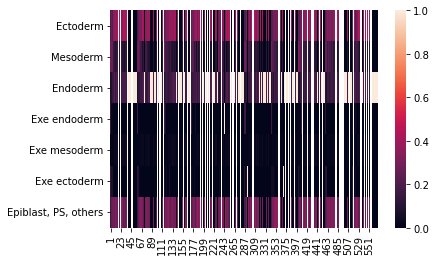

In [78]:
misclassification_counters_pd = pd.DataFrame(misclassification_counters)
misclassification_counters_pd = misclassification_counters_pd.drop('nan')
misclassification_counters_pd_ = misclassification_counters_pd / misclassification_counters_pd.sum()
print(misclassification_counters_pd)

import seaborn as sn
import matplotlib.pyplot as plt
sn.heatmap(misclassification_counters_pd_)
plt.show()

In [73]:
import plotly.express as px
fig = px.bar(misclassification_counters_pd.T,title="number of misclassified cells per iteration")
fig.update_xaxes(title = "iteration count")
fig.update_yaxes(title = "number of misclassified cell")
fig.show()

In [55]:
print(misclassification_nums)

[0.7702702702702703, 0.0, 0.38006756756756754, 0.40371621621621623, 0.4560810810810811, 0.34628378378378377, 0.28885135135135137, 0.3108108108108108, 0.20777027027027026, 0.3108108108108108, 0.22466216216216217, 0.18412162162162163, 0.1858108108108108, 0.21452702702702703, 0.0016891891891891893, 0.21452702702702703, 0.23648648648648649, 0.0, 0.15878378378378377, 0.19087837837837837, 0.0, 0.0, 0.0016891891891891893, 0.22972972972972974, 0.0, 0.14864864864864866, 0.0016891891891891893, 0.14358108108108109, 0.0016891891891891893, 0.19594594594594594, 0.13513513513513514, 0.13682432432432431, 0.14358108108108109, 0.0016891891891891893, 0.16216216216216217, 0.0, 0.0, 0.0, 0.0033783783783783786, 0.0, 0.0016891891891891893, 0.0, 0.0016891891891891893, 0.0033783783783783786, 0.0, 0.0033783783783783786, 0.0, 0.13851351351351351, 0.0016891891891891893, 0.0016891891891891893, 0.12162162162162163, 0.0016891891891891893, 0.0, 0.0016891891891891893, 0.0, 0.0033783783783783786, 0.0016891891891891893,

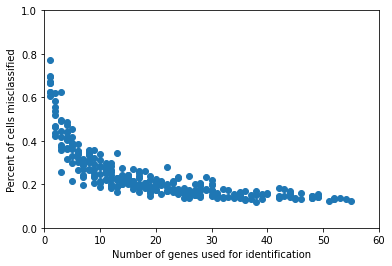

In [56]:
scatterlist = []
scatterlist_final = []
for i in range(0,len(misclassification_nums)):
    scatterlist.append([rand_nums[i],misclassification_nums[i]])
for j in scatterlist:
    if j[1] > 0.1:
        scatterlist_final.append(j)
x, y = zip(*scatterlist_final)
plt.scatter(x, y)
plt.ylim(ymin=0)
plt.ylim(ymax=1)
plt.xlim(xmin=0)
plt.xlim(xmax=60)
plt.xlabel('Number of genes used for identification')
plt.ylabel('Percent of cells misclassified')

plt.show() 

In [57]:
print(data_df_pca)

        ExE ectoderm Mesenchyme ExE endoderm Rostral neurectoderm  \
Xkr4       -0.430642  -1.011839    -0.488811             0.585013   
Gm1992     -0.592015  -1.429060    -0.675790             0.870740   
Gm37381    -0.592015  -1.429060    -0.675790             0.870740   
Rp1        -0.426763  -1.015041    -0.485641             0.601265   
Sox17      -0.341877  -0.351165     2.559129            -0.325645   
...              ...        ...          ...                  ...   
Nps        -0.592015  -1.429060    -0.675790             0.870740   
Gm45339    -0.592015  -1.429060    -0.675790             0.870740   
Foxi2      -0.317121  -0.686742    -0.354115             0.328799   
Gm45340    -0.376828  -0.851582    -0.424343             0.452815   
Clrn3      -0.438103  -1.024251    -0.496767             0.586203   

        ExE endoderm Visceral endoderm Mesenchyme ExE endoderm ExE endoderm  \
Xkr4       -0.476992         -1.046872  -0.758593    -0.855474    -0.159142   
Gm1992     -0

In [58]:
full = data_df_pca.T
full['labels'] = label_df_final.values.tolist()[0]
print(full)

                          Xkr4    Gm1992   Gm37381       Rp1     Sox17  \
ExE ectoderm         -0.430642 -0.592015 -0.592015 -0.426763 -0.341877   
Mesenchyme           -1.011839 -1.429060 -1.429060 -1.015041 -0.351165   
ExE endoderm         -0.488811 -0.675790 -0.675790 -0.485641  2.559129   
Rostral neurectoderm  0.585013  0.870740  0.870740  0.601265 -0.325645   
ExE endoderm         -0.476992 -0.658769 -0.658769 -0.473678  2.358114   
...                        ...       ...       ...       ...       ...   
ExE endoderm         -0.038520 -0.027279 -0.027279 -0.029865  2.339125   
Parietal endoderm     0.757223  1.118758  1.118758  0.775573  1.482654   
NaN                   0.178221  0.284874  0.284874  0.189517  0.357907   
ExE endoderm         -0.419430 -0.575867 -0.575867 -0.415414  0.156630   
ExE ectoderm         -0.547509 -0.760329 -0.760329 -0.545055 -0.343744   

                       Gm37323    Mrpl15    Lypla1   Gm37988     Tcea1  ...  \
ExE ectoderm         -0.592015  

In [59]:
import random
rand_nums = []
for i in range(0,100):
    rand_nums.append(random.randint(1, 14000))
print(rand_nums)

[11443, 11717, 9941, 11956, 2121, 725, 11132, 1260, 5918, 2335, 5421, 12785, 1200, 2582, 6906, 12442, 5679, 8796, 12293, 7508, 3201, 5195, 11220, 2826, 1834, 6711, 11570, 12858, 10764, 822, 6755, 3035, 8245, 9571, 8023, 5991, 3948, 7971, 12859, 8446, 8304, 4143, 5068, 11401, 3132, 1807, 2393, 4792, 2352, 7738, 7952, 12608, 9380, 1344, 6117, 6358, 9639, 5947, 10076, 4616, 4007, 3903, 10682, 5845, 4683, 4272, 8916, 4740, 2055, 3884, 4063, 1319, 13593, 1400, 3672, 6928, 7330, 9887, 13785, 10000, 6821, 3141, 626, 12895, 4877, 10889, 547, 62, 6190, 6559, 2389, 4187, 5236, 9179, 6248, 11508, 365, 4528, 11352, 10340]


In [60]:
misclassification_nums = []
counter = 0
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestClassifier
from sklearn import metrics
for i in rand_nums:
    print(counter)
    counter = counter + 1
    X = full.sample(n=i, axis = 1)
    y = full['labels']



    X_train,X_test,y_train,y_test = train_test_split(X,y,test_size=0.1,random_state=0)
    clf = RandomForestClassifier(n_estimators=100)
    clf.fit(X_train,y_train)
    y_pred = clf.predict(X_test)
    #print (X_test) #test dataset (without the actual outcome)
    #print (y_pred) #predicted values
    y_error = y_pred.tolist()
    x_error = []
    for i in X_test.T:
        x_error.append(i)

    #print(y_error)
    misclassification_names = []
    misclassification_buckets = []
    misclassification_buckets_final = []

    for i in x_error:
        cell = i[0]
        if type(cell)== float:
            cell = 'nan'
        misclassification_names.append(numbers[cell])
    for cells in misclassification_names:
        for j in buckets:
            if cells in buckets[j]:
                misclassification_buckets.append(j)
    for i in misclassification_buckets:
        if i == 'Ectoderm':
            misclassification_buckets_final.append(0)
        elif i == 'Mesoderm':
            misclassification_buckets_final.append(1)
        elif i == 'Endoderm':
            misclassification_buckets_final.append(2)
        elif i == 'Exe endoderm':
            misclassification_buckets_final.append(3)
        elif i == 'Exe mesoderm':
            misclassification_buckets_final.append(4)
        elif i == 'Exe ectoderm':
            misclassification_buckets_final.append(5)
        elif i == 'nan':
            misclassification_buckets_final.append(6)
        elif i == 'Epiblast, PS, others':
            misclassification_buckets_final.append(7)
    #print(misclassification_buckets_final)
    misclassification = 0
    for i in range(0, len(misclassification_buckets_final)):
        if misclassification_buckets_final[i] != y_error[i]:
            misclassification += 1
    #print(misclassification)
    
    misclassification_nums.append(misclassification/len(y_error))

0
1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
17
18
19
20
21
22
23
24
25
26
27
28
29
30
31
32
33
34
35
36
37
38
39
40
41
42
43
44
45
46
47
48
49
50
51
52
53
54
55
56
57
58
59
60
61
62
63
64
65
66
67
68
69
70
71
72
73
74
75
76
77
78
79
80
81
82
83
84
85
86
87
88
89
90
91
92
93
94
95
96
97
98
99


In [61]:
print(misclassification_nums)

[0.16714285714285715, 0.16428571428571428, 0.15571428571428572, 0.16285714285714287, 0.3, 0.3357142857142857, 0.21571428571428572, 0.3414285714285714, 0.23285714285714285, 0.2714285714285714, 0.22714285714285715, 0.20857142857142857, 0.35714285714285715, 0.30142857142857143, 0.18714285714285714, 0.15142857142857144, 0.1657142857142857, 0.22714285714285715, 0.17285714285714285, 0.16428571428571428, 0.19428571428571428, 0.18714285714285714, 0.16142857142857142, 0.2671428571428571, 0.29714285714285715, 0.16428571428571428, 0.1742857142857143, 0.16714285714285715, 0.15285714285714286, 0.36857142857142855, 0.2342857142857143, 0.26285714285714284, 0.14285714285714285, 0.22142857142857142, 0.21857142857142858, 0.23857142857142857, 0.24285714285714285, 0.24142857142857144, 0.1442857142857143, 0.22, 0.15142857142857144, 0.22142857142857142, 0.16142857142857142, 0.16, 0.27714285714285714, 0.14857142857142858, 0.2742857142857143, 0.25857142857142856, 0.2671428571428571, 0.2342857142857143, 0.2257

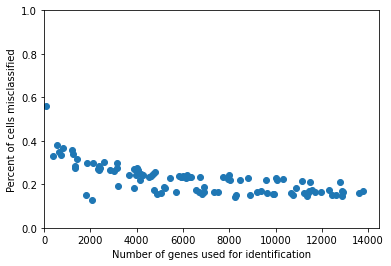

In [62]:
scatterlist = []
scatterlist_final = []
for i in range(0,len(misclassification_nums)):
    scatterlist.append([rand_nums[i],misclassification_nums[i]])
for j in scatterlist:
    if j[1] > 0.02:
        scatterlist_final.append(j)
x, y = zip(*scatterlist_final)
plt.scatter(x, y)
plt.ylim(ymin=0)
plt.ylim(ymax=1)
plt.xlim(xmin=0)

plt.xlabel('Number of genes used for identification')
plt.ylabel('Percent of cells misclassified')

plt.show() 

In [63]:
combined_minus_na = []
combined_minus_na_names = []
combined_gene_names = []

for i in combined.T:
    combined_gene_names.append(i)
for i in range(0,len(combined.T)):
    
    if(type(combined.iloc[:, i].name[0])) == str:
        combined_minus_na_names.append(combined.iloc[:, i].name[0])
        combined_minus_na.append(combined.iloc[:, i].tolist())
    
combined_minus_na = pd.DataFrame(combined_minus_na)
combined_minus_na.columns = combined_gene_names
combined_minus_na = combined_minus_na.T
combined_minus_na.columns = combined_minus_na_names



In [64]:
full_final = full.drop('labels', axis=1)
full_minus_na = []
full_minus_na_names = []
full_genes_minus_na = []
for i in full_final:
    full_genes_minus_na.append(i)
for i in range(0,len(full_final.T)):
    if (type(full_final.T.iloc[:, i].name[0])) == str:
        full_minus_na_names.append(combined.iloc[:,i].name[0])
        full_minus_na.append(combined.iloc[:,i].tolist())
print(full_final)
print(pd.DataFrame(full_minus_na))
full_minus_na = pd.DataFrame(full_minus_na)
full_minus_na.columns = full_genes_minus_na
full_minus_na = full_minus_na.T
full_minus_na.columns = full_minus_na_names
print(full_minus_na)

IndexError: single positional indexer is out-of-bounds

In [ ]:
names_vague = []
for i in full_final.T:
    names_vague.append(i[0])

In [ ]:
X = full_final[gene_df]

pca = PCA(n_components = 2)
components = pca.fit_transform(X)
fig = px.scatter(components, x=0, y=1, color = names_vague)
fig.show()

pca = PCA(n_components =3)
components = pca.fit_transform(X)
fig = px.scatter_3d(components, x = 0, y = 1, z = 2, color = names_vague)
fig.show()


,0
0,Actb
1,Apoe
2,Apom
3,Avp
4,Cdx2
5,Cer1
6,Cldn6
7,Cldn7
8,Dnmt3b
9,Epcam
